# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

### ResNet18-LSTM

In [6]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        ### Freeze Parameters
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder, remove prediction layer
        self.cnn = nn.Sequential(*list(resnet18.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [7]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet50.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)    
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [8]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet101.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM

In [9]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 50176 # densenet121.classifier.in_features
        
        for param in densenet121.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet121.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
#         self.cnn_output_size = image_emb.shape[0]
        
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)

        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [10]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 81536 # densenet169.classifier.in_features
        
        for param in densenet169.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet169.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [11]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 94080 #densenet201.classifier.in_features
        
        
        for param in densenet201.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet201.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [12]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
       
        for param in vgg11bn.parameters():
            param.requires_grad = False

        
        vgg11bn.classifier = nn.Sequential(*list(vgg11bn.classifier.children())[:-1])
        
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [13]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

        
        vgg16bn.classifier = nn.Sequential(*list(vgg16bn.classifier.children())[:-1])

            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [14]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

        
        vgg19bn.classifier = nn.Sequential(*list(vgg19bn.classifier.children())[:-1])
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [15]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [16]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(network.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModels/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
            
            fig.savefig('CNN_RNN_700_1_50_TrainingSummary/' + model_name + '_FOLD' + str(fold+1) + '.png')
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 700, Number of Layers = 1, Dropout = 0.5

In [17]:
resnet18LSTM_700_1_50 = ResNet18_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
resnet50LSTM_700_1_50 = ResNet50_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
resnet101LSTM_700_1_50 = ResNet101_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)

densenet121LSTM_700_1_50 = DenseNet121_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
densenet169LSTM_700_1_50 = DenseNet169_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
densenet201LSTM_700_1_50 = DenseNet201_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)

vgg11bnLSTM_700_1_50 = VGG11_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
vgg16bnLSTM_700_1_50 = VGG16_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
vgg19bnLSTM_700_1_50 = VGG19_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)

# 
# 

## Train Models

In [18]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0239 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1269 	Validation F1 Micro: 0.0
Train F1 Marco: 0.093 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1429 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1397 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1142 	Validation Recall Micro: 0.0
Train Recall Marco: 0.112 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0131 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

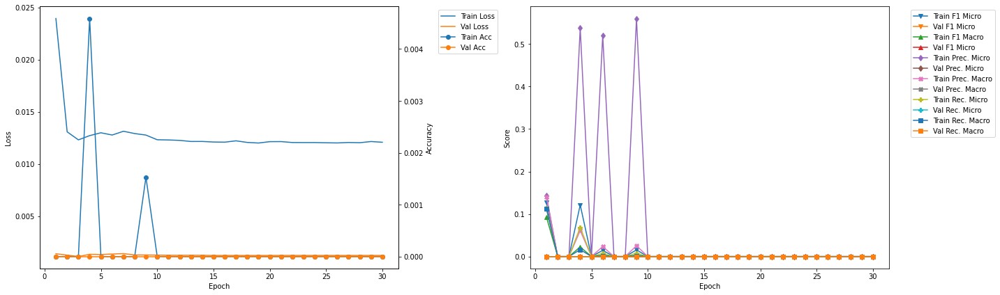

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 3.93
Train Loss: 0.015 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0601 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0332 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1529 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1182 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0374 	Validation Recall Micro: 0.0
Train Recall Marco: 0.024 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.05
Train Loss: 0.0128 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

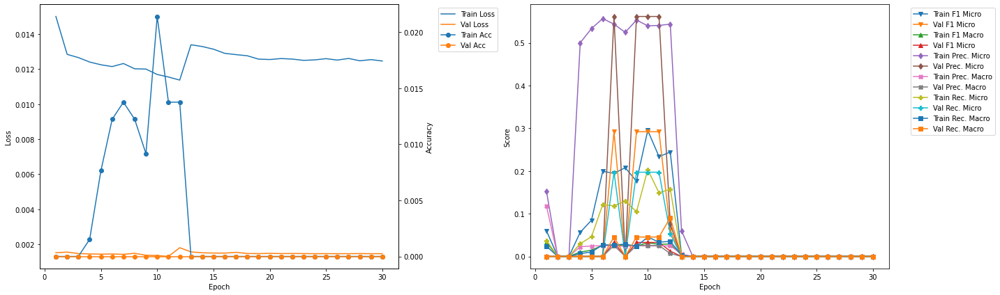

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.68
Train Loss: 0.0155 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0727 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0391 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.164 	Validation Precision Micro: 0.0
Train Precision Marco: 0.103 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0467 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0614 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.8
Train Loss: 0.013 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Valid

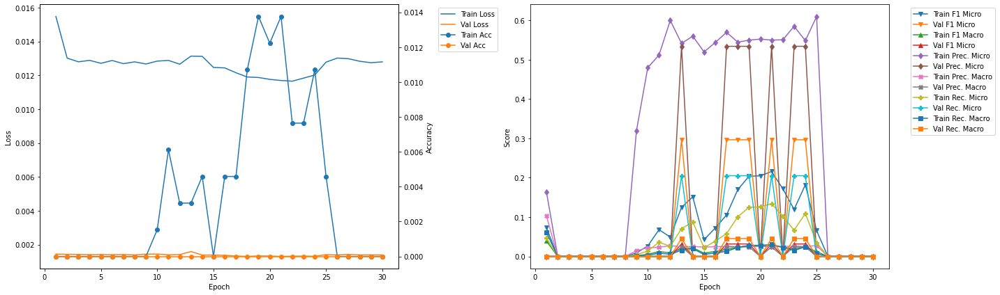

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.44
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0517 	Validation F1 Micro: 0.0
Train F1 Marco: 0.01 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.6267 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0285 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0269 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0061 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.57
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0

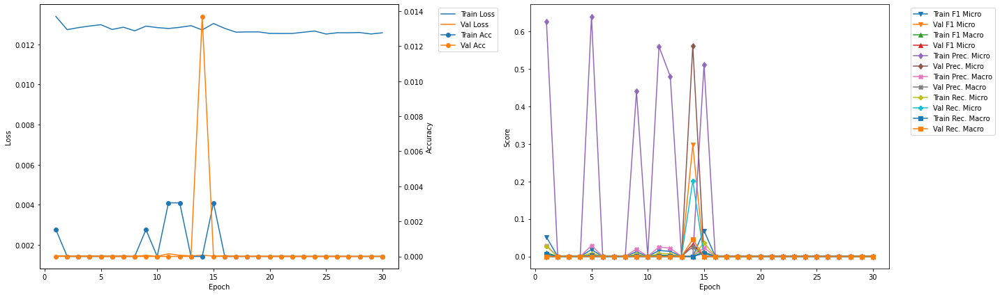

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.2
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0712 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0126 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.536 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0244 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0381 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0085 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.32
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0157 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0033 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.56 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0255 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.008 	Validation Recall Micro: 0.0
Train Re

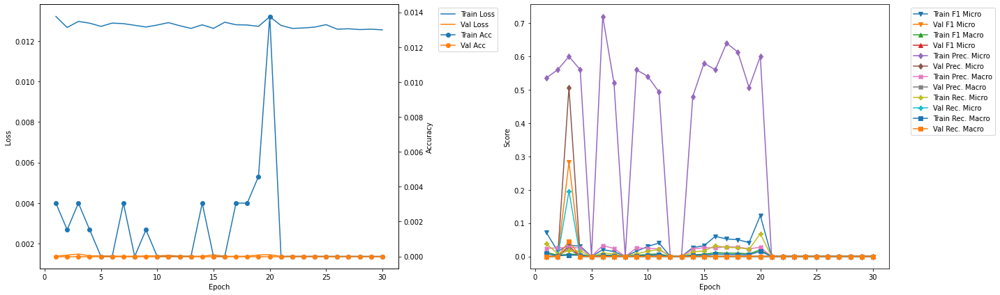

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.94
Train Loss: 0.0144 	Validation Loss: 0.0015
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1318 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0458 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2937 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1095 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.085 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0377 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.07
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.

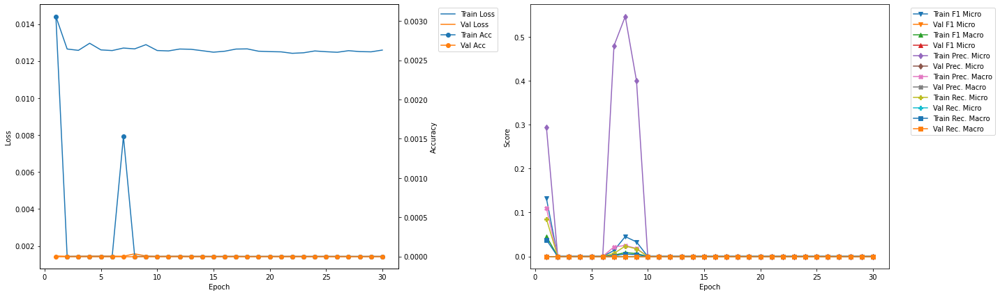

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.69
Train Loss: 0.0151 	Validation Loss: 0.0015
Train Accuracy: 0.0031 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.1342 	Validation F1 Micro: 0.2756
Train F1 Marco: 0.0479 	Validation F1 Macro: 0.0295
Train Precision Mirco: 0.2911 	Validation Precision Micro: 0.4795
Train Precision Marco: 0.1102 	Validation Precision Macro: 0.0218
Train Recall Mirco: 0.0872 	Validation Recall Micro: 0.1934
Train Recall Marco: 0.0509 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.82
Train Loss: 0.0128 	Validation Loss: 0.0013
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.033 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0067 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0273 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.017 	Validation Recal

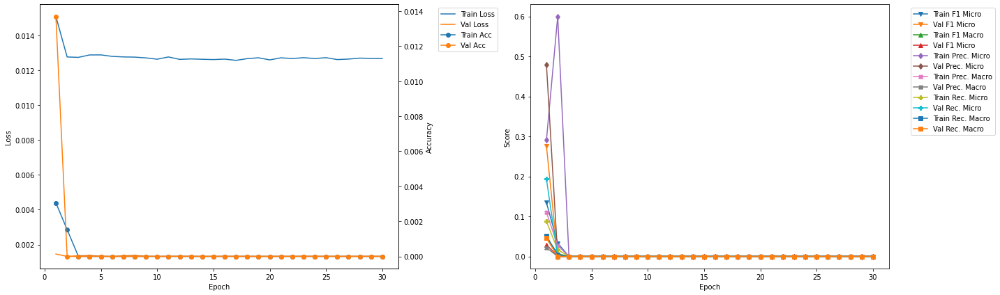

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.44
Train Loss: 0.0149 	Validation Loss: 0.0015
Train Accuracy: 0.0076 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1292 	Validation F1 Micro: 0.2537
Train F1 Marco: 0.0476 	Validation F1 Macro: 0.0292
Train Precision Mirco: 0.2685 	Validation Precision Micro: 0.4722
Train Precision Marco: 0.0996 	Validation Precision Macro: 0.0215
Train Recall Mirco: 0.0851 	Validation Recall Micro: 0.1735
Train Recall Marco: 0.0421 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.57
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0605 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0111 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.56 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0255 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.032 	Validation Recall

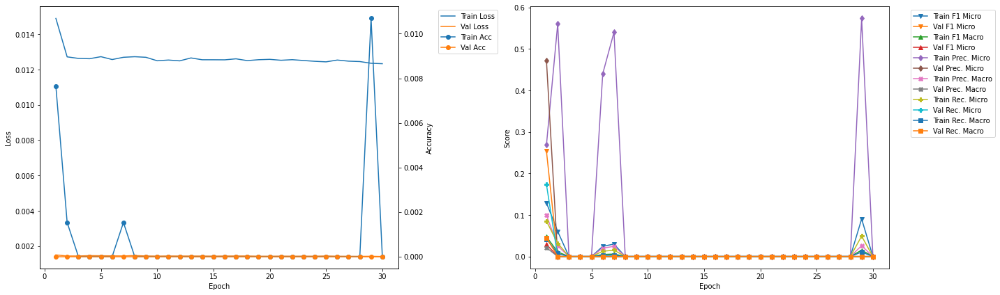

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.19
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0464 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0102 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2933 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0352 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0252 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0061 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.32
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.029 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0059 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.52 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0236 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0149 	Validation Recall Micro: 0.0
Train Rec

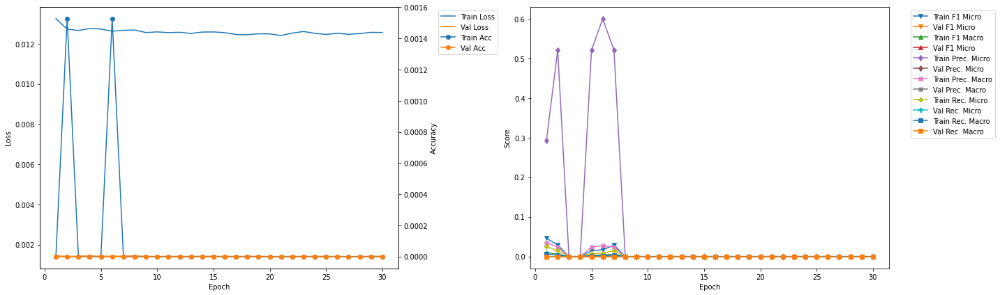

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.95
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0061 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1179 	Validation F1 Micro: 0.0
Train F1 Marco: 0.02 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.472 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0255 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0674 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0164 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.07
Train Loss: 0.0127 	Validation Loss: 0.0015
Train Accuracy: 0.0061 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0616 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0114 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.57 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0259 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0325 	Validation Recall Micro: 0.0
Train R

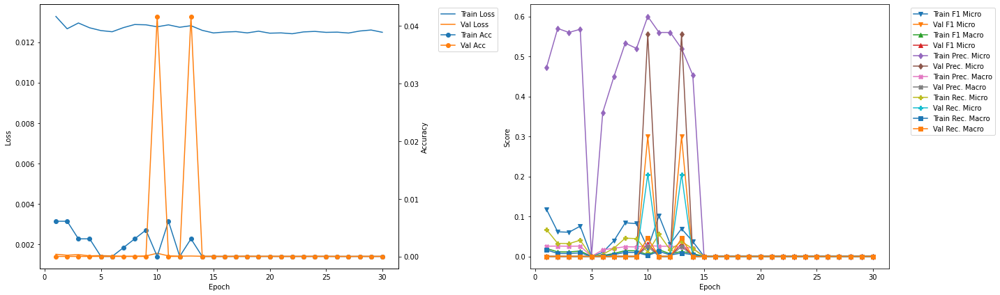

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 10
Train Loss: 0.0128 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.0202 	Validation F1 Micro: 0.2996
Train F1 Marco: 0.0043 	Validation F1 Macro: 0.0325
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.5556
Train Precision Marco: 0.0273 	Validation Precision Macro: 0.0253
Train Recall Mirco: 0.0103 	Validation Recall Micro: 0.2051
Train Recall Marco: 0.0023 	Validation Recall Macro: 0.0455


In [19]:
resnet18LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = resnet18LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.0179 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0045 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0049 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0952 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0152 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0029 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0123 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

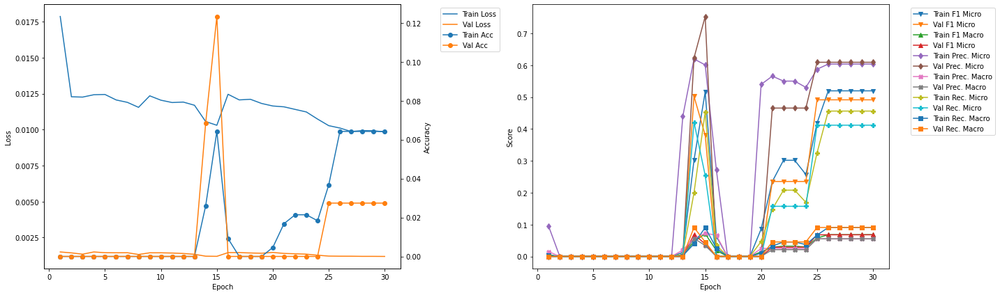

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.36
Train Loss: 0.0131 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0855 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0225 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3164 	Validation Precision Micro: 0.0
Train Precision Marco: 0.077 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0495 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0148 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.5
Train Loss: 0.0124 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

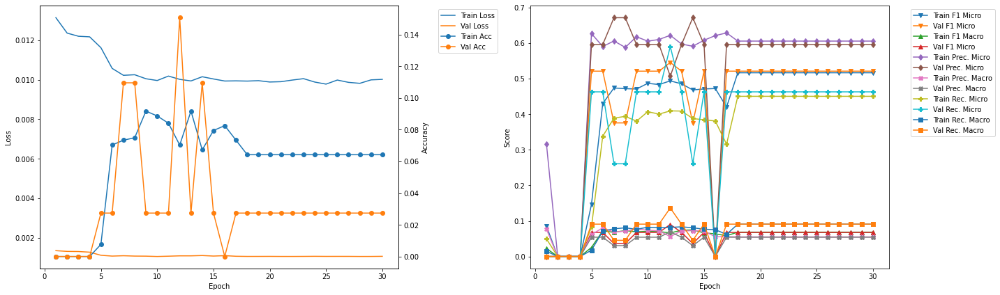

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.545455 --> 0.558559).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 8.59
Train Loss: 0.0104 	Validation Loss: 0.001
Train Accuracy: 0.0474 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4082 	Validation F1 Micro: 0.5586
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0705
Train Precision Mirco: 0.5518 	Validation Precision Micro: 0.637
Train Precision Marco: 0.074 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3239 	Validation Recall Micro: 0.4973
Train Recall Marco: 0.0696 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.73
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0703 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4735 	Validation F1 Micro: 0.5586
Train F1 Marco: 0.0638 	Validation F1 Macro: 0.0705
Train Precision Mirco: 0.6058 	Validation Precision Micro: 0.637
Train Precision M

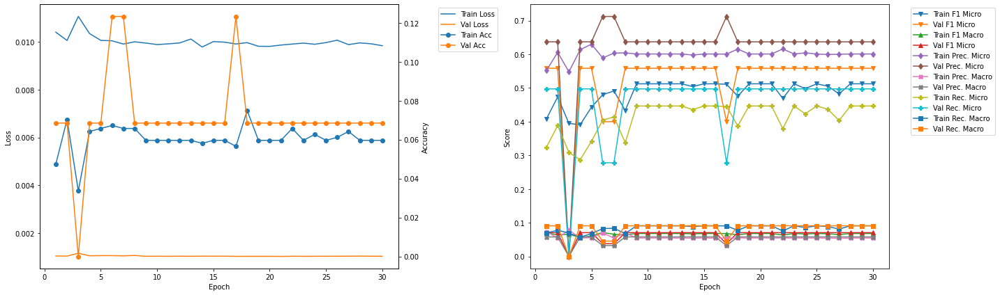

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.81
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4518 	Validation F1 Micro: 0.381
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.5833 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.0706 	Validation Precision Macro: 0.0324
Train Recall Mirco: 0.3686 	Validation Recall Micro: 0.26
Train Recall Marco: 0.0756 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.95
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4684 	Validation F1 Micro: 0.5202
Train F1 Marco: 0.063 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.621 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3761 	Val

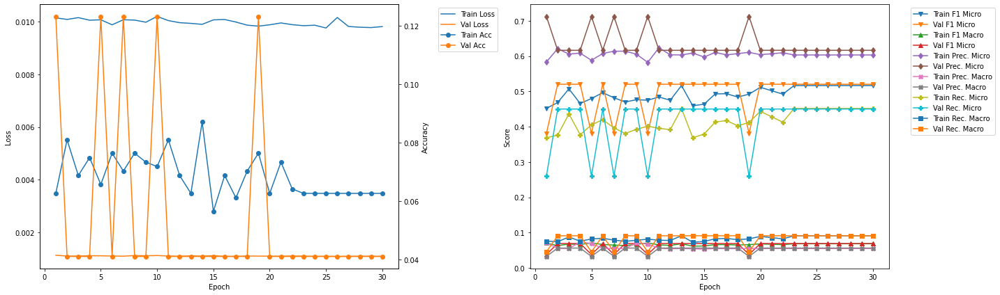

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.03
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4592 	Validation F1 Micro: 0.3663
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.037
Train Precision Mirco: 0.6087 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.0727 	Validation Precision Macro: 0.0311
Train Recall Mirco: 0.3686 	Validation Recall Micro: 0.25
Train Recall Marco: 0.0733 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.17
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4743 	Validation F1 Micro: 0.5202
Train F1 Marco: 0.0635 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.611 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3875 	Valid

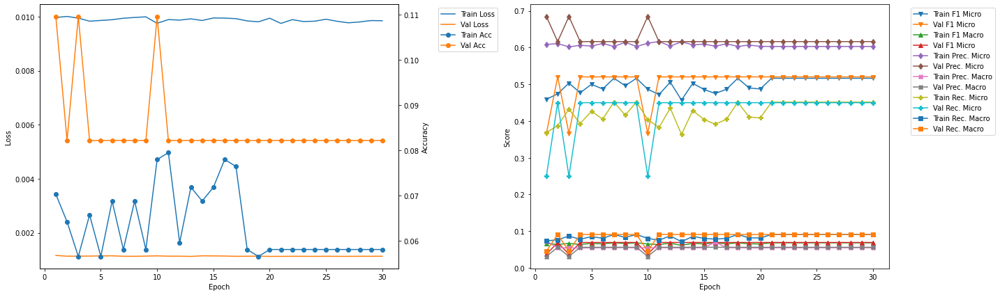

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.25
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4667 	Validation F1 Micro: 0.4657
Train F1 Marco: 0.0621 	Validation F1 Macro: 0.0632
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.3771 	Validation Recall Micro: 0.4127
Train Recall Marco: 0.0734 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.39
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5225 	Validation F1 Micro: 0.4657
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0632
Train Precision Mirco: 0.6124 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4556 	

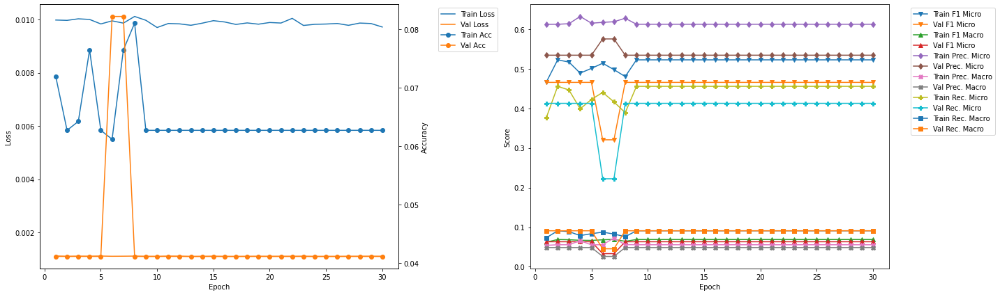

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.47
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5086 	Validation F1 Micro: 0.3542
Train F1 Marco: 0.0703 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0729 	Validation Precision Macro: 0.0299
Train Recall Mirco: 0.4408 	Validation Recall Micro: 0.2424
Train Recall Marco: 0.0884 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.61
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4739 	Validation F1 Micro: 0.4884
Train F1 Marco: 0.0633 	Validation F1 Macro: 0.0661
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.38

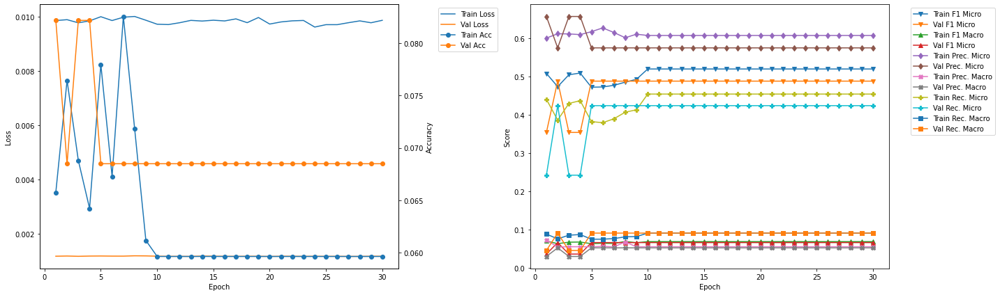

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.69
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5115 	Validation F1 Micro: 0.4884
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4402 	Validation Recall Micro: 0.42
Train Recall Marco: 0.0876 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.83
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0809 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4919 	Validation F1 Micro: 0.4884
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6164 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4093 	Valida

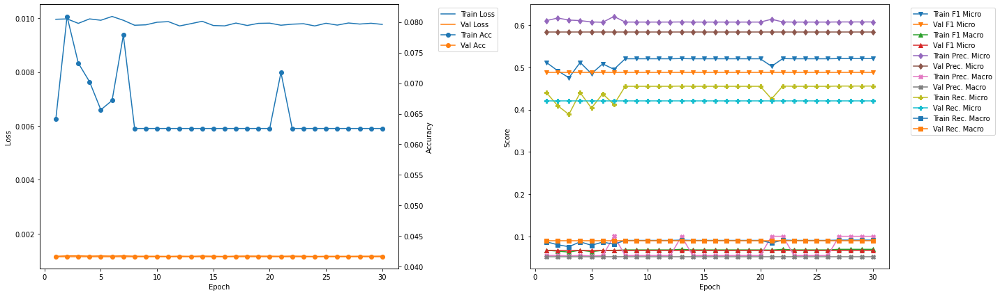

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.9
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.498 	Validation F1 Micro: 0.5321
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.5965 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0581 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4274 	Validation Recall Micro: 0.4754
Train Recall Marco: 0.0871 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.04
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4943 	Validation F1 Micro: 0.5321
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6074 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4167 

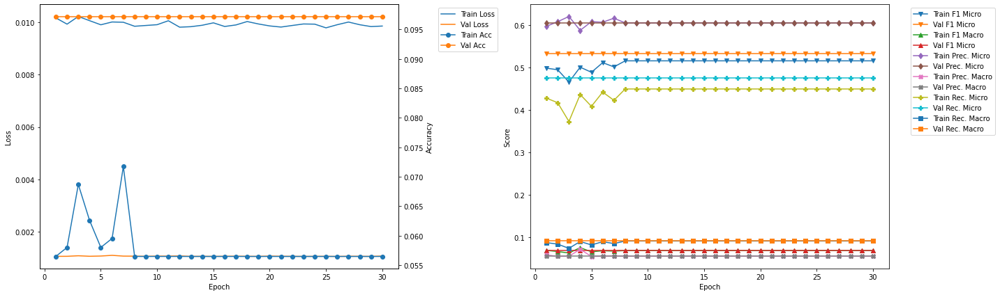

-------------------------------------------
FOLD 10
-------------------------------------------
Validation F1 Micro Score Increased (0.558559 --> 0.587879).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 38.12
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0855 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.48 	Validation F1 Micro: 0.5879
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0731
Train Precision Mirco: 0.6043 	Validation Precision Micro: 0.6736
Train Precision Marco: 0.0708 	Validation Precision Macro: 0.0612
Train Recall Mirco: 0.3981 	Validation Recall Micro: 0.5215
Train Recall Marco: 0.0806 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.26
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0672 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4874 	Validation F1 Micro: 0.5879
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0731
Train Precision Mirco: 0.6059 	Validation Precision Micro: 0.6736
Train Precision

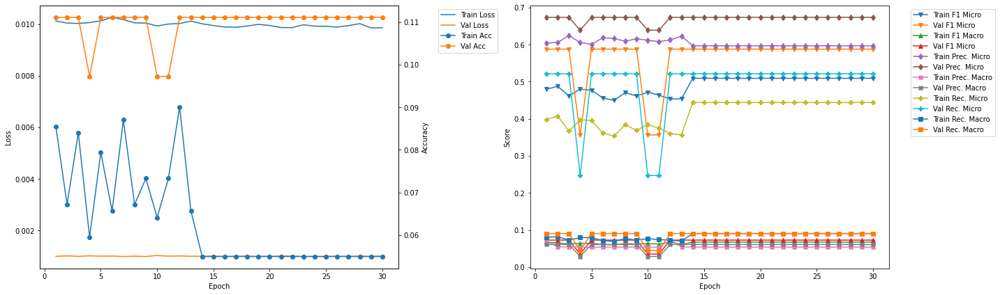

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0855 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.48 	Validation F1 Micro: 0.5879
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0731
Train Precision Mirco: 0.6043 	Validation Precision Micro: 0.6736
Train Precision Marco: 0.0708 	Validation Precision Macro: 0.0612
Train Recall Mirco: 0.3981 	Validation Recall Micro: 0.5215
Train Recall Marco: 0.0806 	Validation Recall Macro: 0.0909


In [20]:
resnet50LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = resnet50LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0171 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0838 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0432 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1784 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1058 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0548 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0459 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.013 	Validation Loss: 0.0015
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0012 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.04 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0018 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recal

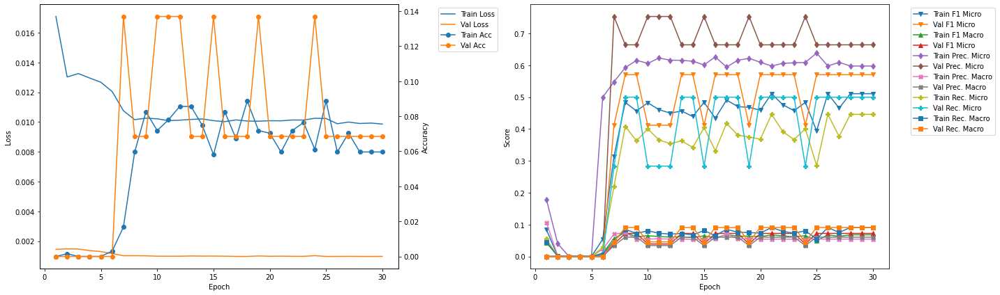

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.95
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0872 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4567 	Validation F1 Micro: 0.503
Train F1 Marco: 0.0617 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.626 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.3595 	Validation Recall Micro: 0.4427
Train Recall Marco: 0.0704 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.1
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4988 	Validation F1 Micro: 0.3396
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.6142 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.4199 	Vali

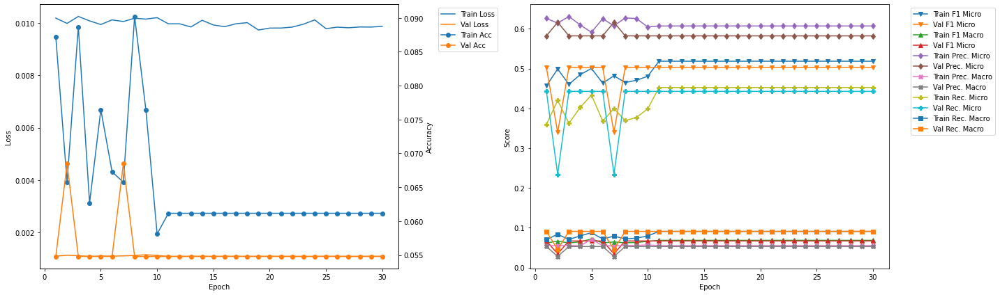

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.71
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.137
Train F1 Mirco: 0.4795 	Validation F1 Micro: 0.3821
Train F1 Marco: 0.0716 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6083 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0727 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.3957 	Validation Recall Micro: 0.2717
Train Recall Marco: 0.0804 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.87
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5123 	Validation F1 Micro: 0.5204
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0656
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.4414 	

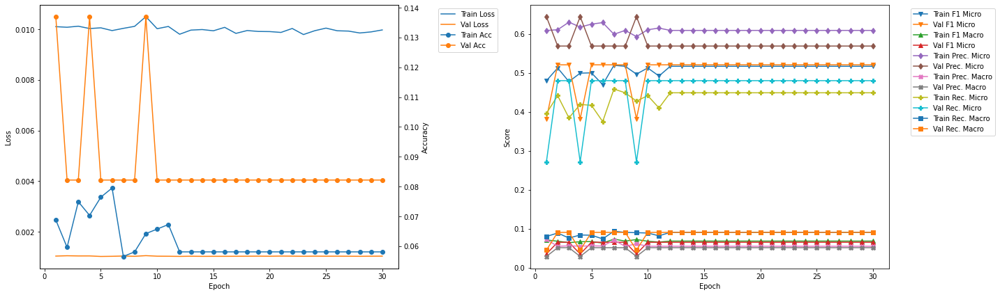

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.48
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4739 	Validation F1 Micro: 0.5179
Train F1 Marco: 0.0638 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6214 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.383 	Validation Recall Micro: 0.4579
Train Recall Marco: 0.0758 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.64
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5007 	Validation F1 Micro: 0.5179
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6065 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4263 

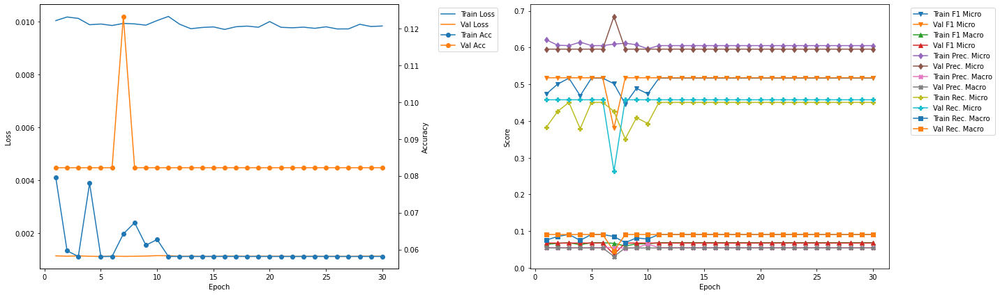

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.25
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4834 	Validation F1 Micro: 0.528
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0666
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4032 	Validation Recall Micro: 0.483
Train Recall Marco: 0.0807 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.41
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4675 	Validation F1 Micro: 0.528
Train F1 Marco: 0.0629 	Validation F1 Macro: 0.0666
Train Precision Mirco: 0.6087 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.3794 	V

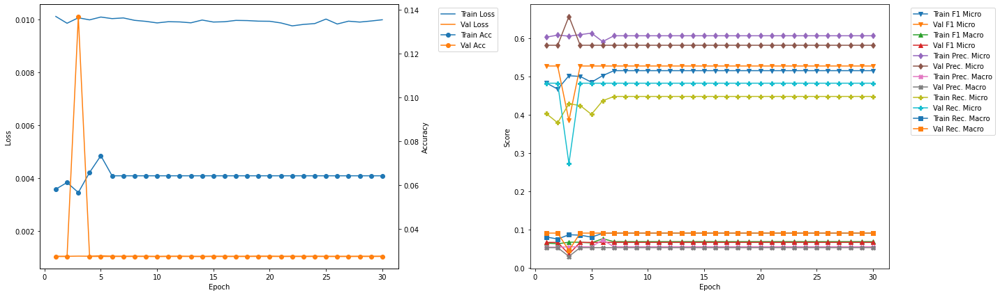

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.02
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5008 	Validation F1 Micro: 0.494
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.057 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.4297 	Validation Recall Micro: 0.4368
Train Recall Marco: 0.0862 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.17
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4645 	Validation F1 Micro: 0.494
Train F1 Marco: 0.0622 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.6273 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.3688 

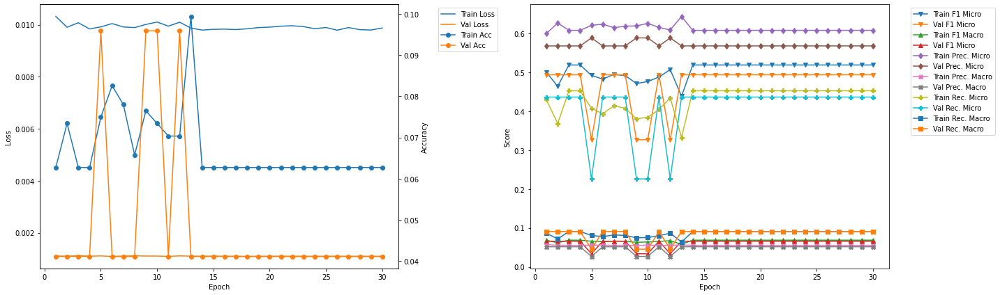

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.78
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5053 	Validation F1 Micro: 0.5116
Train F1 Marco: 0.0703 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.597 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0604 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.438 	Validation Recall Micro: 0.4444
Train Recall Marco: 0.0894 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.94
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.498 	Validation F1 Micro: 0.3542
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.6183 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0299
Train Recall Mirco: 0.4168 	Val

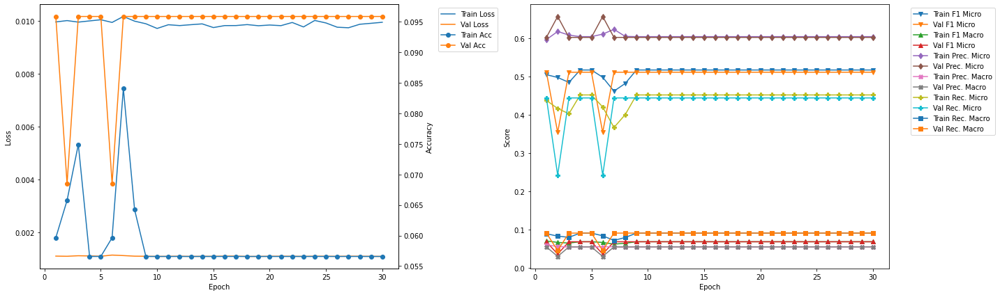

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.56
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0733 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4736 	Validation F1 Micro: 0.5127
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0704
Train Precision Mirco: 0.6072 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.0605 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.3882 	Validation Recall Micro: 0.4313
Train Recall Marco: 0.0777 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.71
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5073 	Validation F1 Micro: 0.5127
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0704
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.43

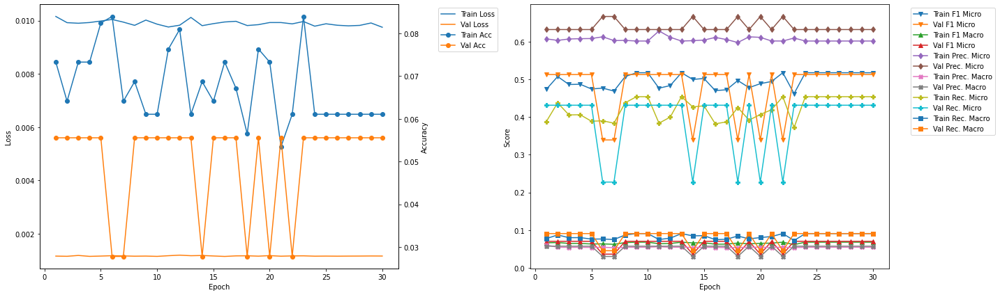

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.32
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0763 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4925 	Validation F1 Micro: 0.5167
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6059 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4148 	Validation Recall Micro: 0.4306
Train Recall Marco: 0.0822 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.48
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0611 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4957 	Validation F1 Micro: 0.5167
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6025 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4211

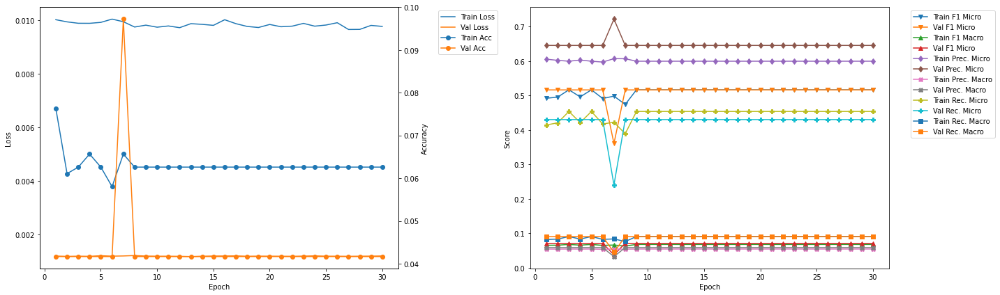

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 43.08
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4922 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4172 	Validation Recall Micro: 0.4203
Train Recall Marco: 0.0825 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.24
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5193 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4552 	

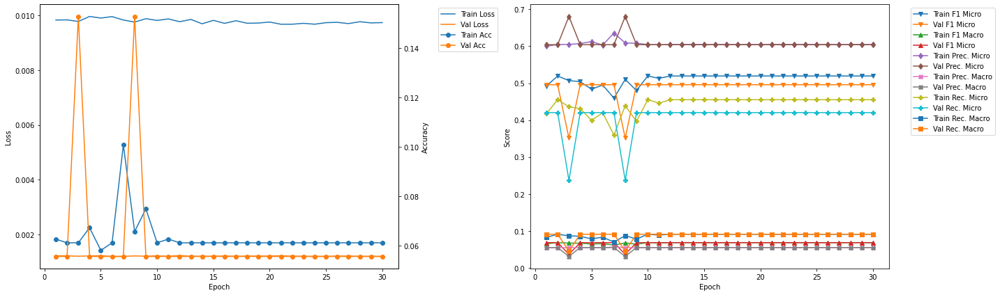

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 1 	Epoch: 8
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4836 	Validation F1 Micro: 0.5706
Train F1 Marco: 0.0752 	Validation F1 Macro: 0.0723
Train Precision Mirco: 0.5927 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0748 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.4084 	Validation Recall Micro: 0.5
Train Recall Marco: 0.0849 	Validation Recall Macro: 0.0909


In [21]:
resnet101LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = resnet101LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.15
Train Loss: 0.0183 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0414 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0373 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0735 	Validation Precision Micro: 0.0
Train Precision Marco: 0.098 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0288 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0329 	Validation Recall Macro: 0.0

Validation F1 Micro Score Increased (0.000000 --> 0.258993).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0118 	Validation Loss: 0.0014
Train Accuracy: 0.0229 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.1779 	Validation F1 Micro: 0.259
Train F1 Marco: 0.0349 	Validation F1 Macro: 0.0329
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.5217
Train Precision Marco: 0.0686 	Validation

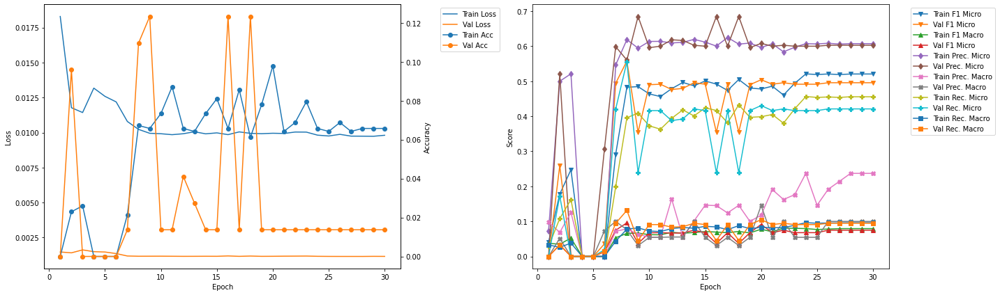

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.76
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0505 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4855 	Validation F1 Micro: 0.3507
Train F1 Marco: 0.0816 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.5954 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.1682 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.4098 	Validation Recall Micro: 0.241
Train Recall Marco: 0.0883 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.91
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4785 	Validation F1 Micro: 0.3507
Train F1 Marco: 0.0714 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6192 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.1237 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.3898 	Va

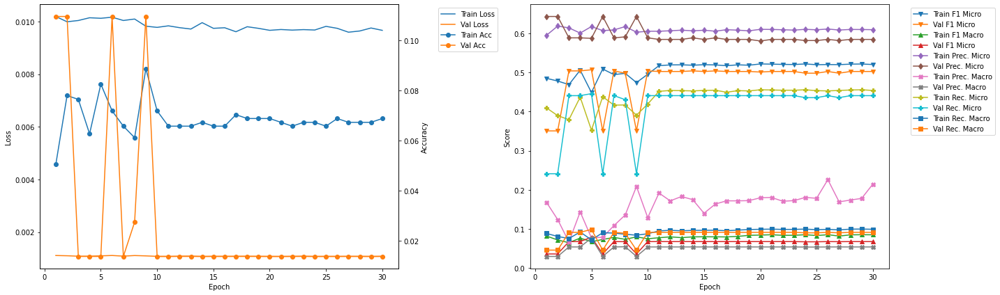

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.35
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4734 	Validation F1 Micro: 0.3663
Train F1 Marco: 0.0765 	Validation F1 Macro: 0.0822
Train Precision Mirco: 0.5998 	Validation Precision Micro: 0.641
Train Precision Marco: 0.1322 	Validation Precision Macro: 0.1385
Train Recall Mirco: 0.391 	Validation Recall Micro: 0.2564
Train Recall Marco: 0.0839 	Validation Recall Macro: 0.0828

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.5
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4839 	Validation F1 Micro: 0.5349
Train F1 Marco: 0.0772 	Validation F1 Macro: 0.107
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.6174
Train Precision Marco: 0.1306 	Validation Precision Macro: 0.1244
Train Recall Mirco: 0.4001 	Va

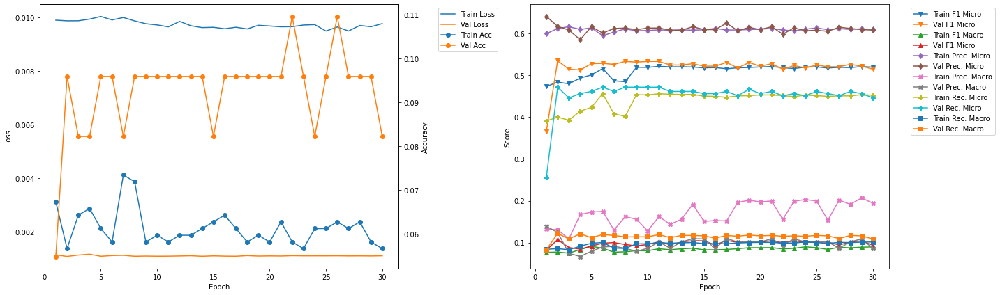

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 13.93
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4695 	Validation F1 Micro: 0.4943
Train F1 Marco: 0.0748 	Validation F1 Macro: 0.0901
Train Precision Mirco: 0.6155 	Validation Precision Micro: 0.5918
Train Precision Marco: 0.1363 	Validation Precision Macro: 0.1292
Train Recall Mirco: 0.3794 	Validation Recall Micro: 0.4244
Train Recall Marco: 0.0797 	Validation Recall Macro: 0.104

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.08
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0856 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4842 	Validation F1 Micro: 0.4915
Train F1 Marco: 0.08 	Validation F1 Macro: 0.0812
Train Precision Mirco: 0.6227 	Validation Precision Micro: 0.5839
Train Precision Marco: 0.1214 	Validation Precision Macro: 0.076
Train Recall Mirco: 0.3961 	Va

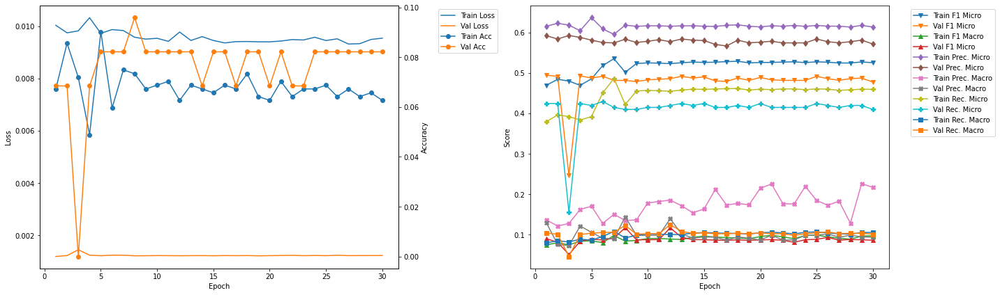

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.52
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4961 	Validation F1 Micro: 0.3422
Train F1 Marco: 0.0847 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.6338
Train Precision Marco: 0.134 	Validation Precision Macro: 0.0296
Train Recall Mirco: 0.4217 	Validation Recall Micro: 0.2344
Train Recall Marco: 0.0936 	Validation Recall Macro: 0.0445

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.68
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5007 	Validation F1 Micro: 0.5179
Train F1 Marco: 0.0844 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6149 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.1667 	Validation Precision Macro: 0.0553
Train Recall Mirco: 0.422

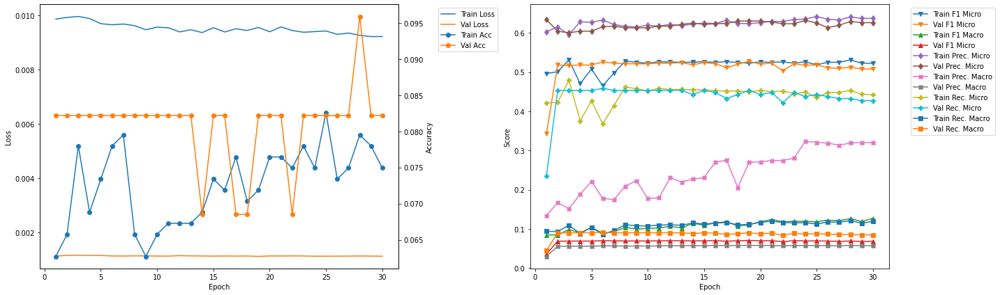

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.557692 --> 0.578378).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 23.12
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5085 	Validation F1 Micro: 0.5784
Train F1 Marco: 0.0999 	Validation F1 Macro: 0.1347
Train Precision Mirco: 0.618 	Validation Precision Micro: 0.6815
Train Precision Marco: 0.2206 	Validation Precision Macro: 0.2275
Train Recall Mirco: 0.4319 	Validation Recall Micro: 0.5023
Train Recall Marco: 0.103 	Validation Recall Macro: 0.1286

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.27
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5203 	Validation F1 Micro: 0.5553
Train F1 Marco: 0.1064 	Validation F1 Macro: 0.1159
Train Precision Mirco: 0.5955 	Validation Precision Micro: 0.6519
Train Precis

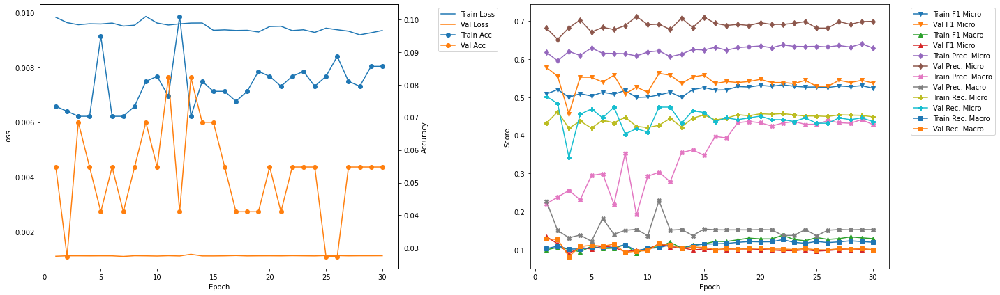

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 27.71
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5159 	Validation F1 Micro: 0.5552
Train F1 Marco: 0.1192 	Validation F1 Macro: 0.0935
Train Precision Mirco: 0.6039 	Validation Precision Micro: 0.6377
Train Precision Marco: 0.3253 	Validation Precision Macro: 0.1478
Train Recall Mirco: 0.4502 	Validation Recall Micro: 0.4916
Train Recall Marco: 0.1156 	Validation Recall Macro: 0.101

Epoch 2 	Learning Rate: 0.01 	Time (min): 27.86
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.52 	Validation F1 Micro: 0.4563
Train F1 Marco: 0.1078 	Validation F1 Macro: 0.0752
Train Precision Mirco: 0.6251 	Validation Precision Micro: 0.7143
Train Precision Marco: 0.2639 	Validation Precision Macro: 0.1357
Train Recall Mirco: 0.4451 	V

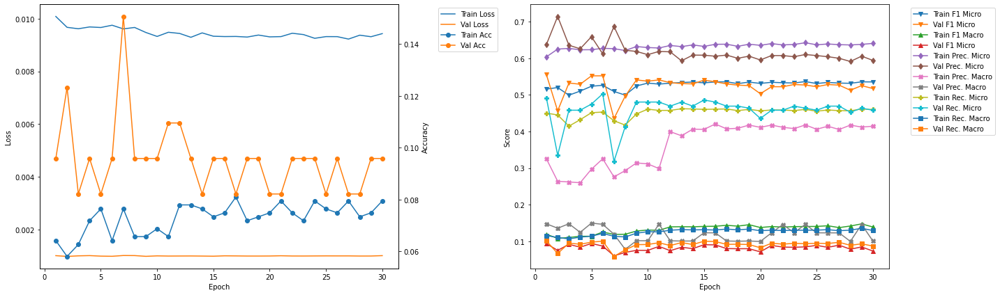

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 32.3
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0702 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5205 	Validation F1 Micro: 0.475
Train F1 Marco: 0.1212 	Validation F1 Macro: 0.1023
Train Precision Mirco: 0.6324 	Validation Precision Micro: 0.5468
Train Precision Marco: 0.3412 	Validation Precision Macro: 0.1121
Train Recall Mirco: 0.4422 	Validation Recall Micro: 0.4199
Train Recall Marco: 0.1153 	Validation Recall Macro: 0.1116

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.45
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0763 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5114 	Validation F1 Micro: 0.5047
Train F1 Marco: 0.1246 	Validation F1 Macro: 0.092
Train Precision Mirco: 0.64 	Validation Precision Micro: 0.5786
Train Precision Marco: 0.3417 	Validation Precision Macro: 0.0967
Train Recall Mirco: 0.4258 	Val

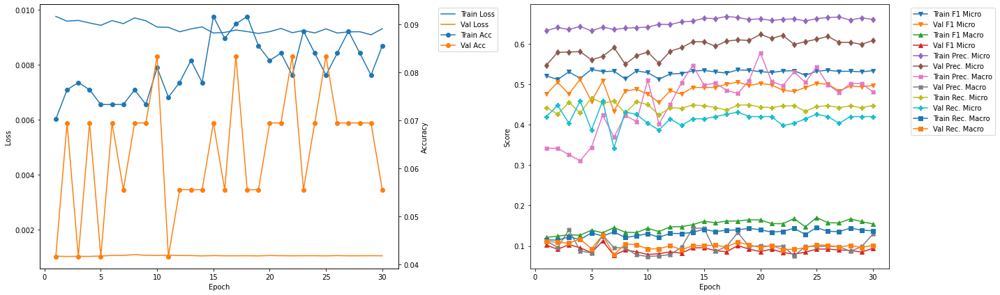

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.89
Train Loss: 0.0097 	Validation Loss: 0.0009
Train Accuracy: 0.087 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5016 	Validation F1 Micro: 0.5774
Train F1 Marco: 0.1112 	Validation F1 Macro: 0.2168
Train Precision Mirco: 0.6416 	Validation Precision Micro: 0.6467
Train Precision Marco: 0.3127 	Validation Precision Macro: 0.3262
Train Recall Mirco: 0.4117 	Validation Recall Micro: 0.5215
Train Recall Marco: 0.1055 	Validation Recall Macro: 0.195

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.04
Train Loss: 0.0095 	Validation Loss: 0.001
Train Accuracy: 0.0748 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5118 	Validation F1 Micro: 0.5549
Train F1 Marco: 0.1356 	Validation F1 Macro: 0.1314
Train Precision Mirco: 0.6274 	Validation Precision Micro: 0.6408
Train Precision Marco: 0.3935 	Validation Precision Macro: 0.194
Train Recall Mirco: 0.4321 	

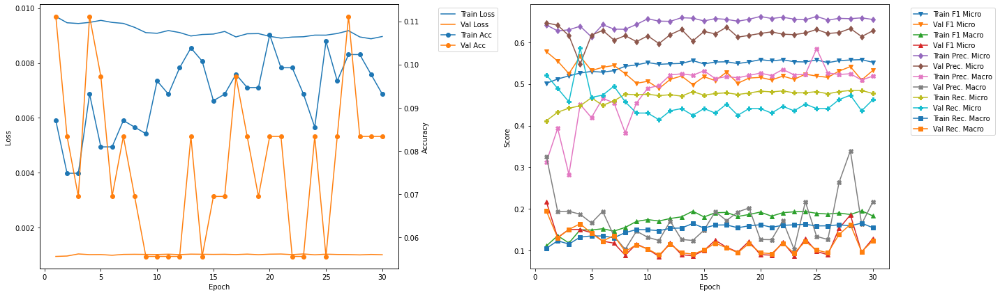

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 41.47
Train Loss: 0.0095 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.5379 	Validation F1 Micro: 0.5488
Train F1 Marco: 0.1517 	Validation F1 Macro: 0.1048
Train Precision Mirco: 0.6307 	Validation Precision Micro: 0.6618
Train Precision Marco: 0.4075 	Validation Precision Macro: 0.1589
Train Recall Mirco: 0.4689 	Validation Recall Micro: 0.4688
Train Recall Marco: 0.1369 	Validation Recall Macro: 0.11

Epoch 2 	Learning Rate: 0.01 	Time (min): 41.63
Train Loss: 0.0093 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.5109 	Validation F1 Micro: 0.5321
Train F1 Marco: 0.1499 	Validation F1 Macro: 0.096
Train Precision Mirco: 0.6364 	Validation Precision Micro: 0.6444
Train Precision Marco: 0.3875 	Validation Precision Macro: 0.1505
Train Recall Mirco: 0.4268

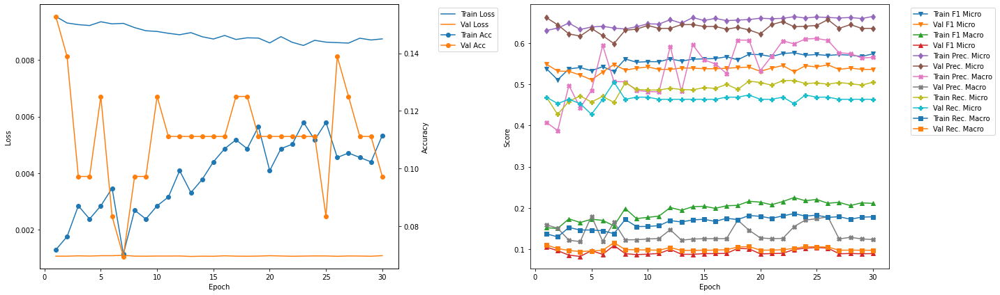

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 1
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5085 	Validation F1 Micro: 0.5784
Train F1 Marco: 0.0999 	Validation F1 Macro: 0.1347
Train Precision Mirco: 0.618 	Validation Precision Micro: 0.6815
Train Precision Marco: 0.2206 	Validation Precision Macro: 0.2275
Train Recall Mirco: 0.4319 	Validation Recall Micro: 0.5023
Train Recall Marco: 0.103 	Validation Recall Macro: 0.1286


In [22]:
densenet121LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = densenet121LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.017 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0892 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0579 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1288 	Validation Precision Micro: 0.0
Train Precision Marco: 0.118 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0682 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0564 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.35
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0045 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0122 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1818 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1818 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0
Train Recall 

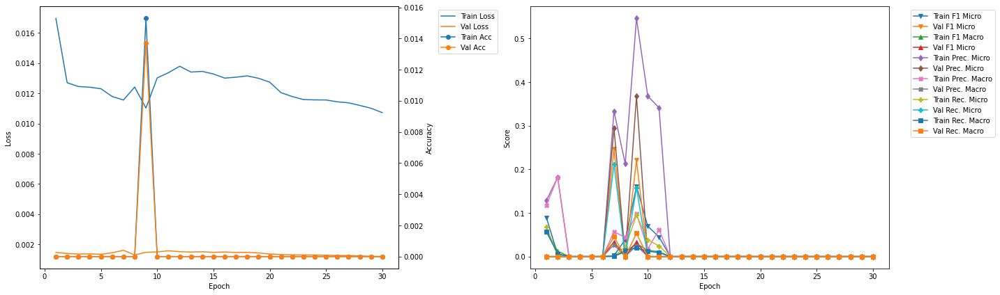

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.38
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0111 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0032 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2083 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0625 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0057 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0017 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.55
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

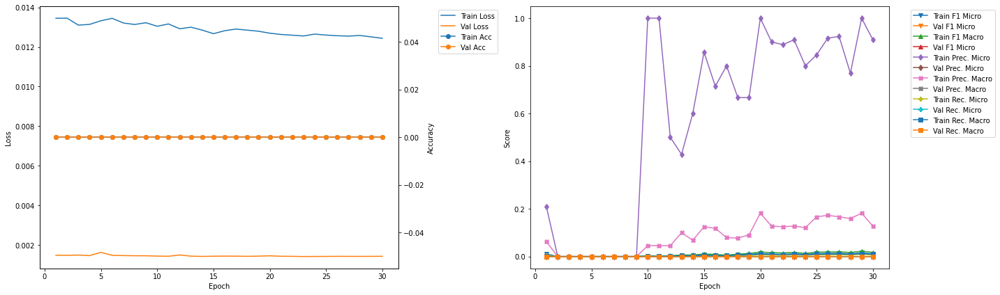

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.56
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0328 	Validation F1 Micro: 0.0205
Train F1 Marco: 0.0157 	Validation F1 Macro: 0.0357
Train Precision Mirco: 0.4054 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.1183 	Validation Precision Macro: 0.0682
Train Recall Mirco: 0.0171 	Validation Recall Micro: 0.0104
Train Recall Marco: 0.0089 	Validation Recall Macro: 0.0303

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.73
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0135 	Validation F1 Micro: 0.0205
Train F1 Marco: 0.0132 	Validation F1 Macro: 0.0433
Train Precision Mirco: 0.48 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.1851 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.0068 	Validation

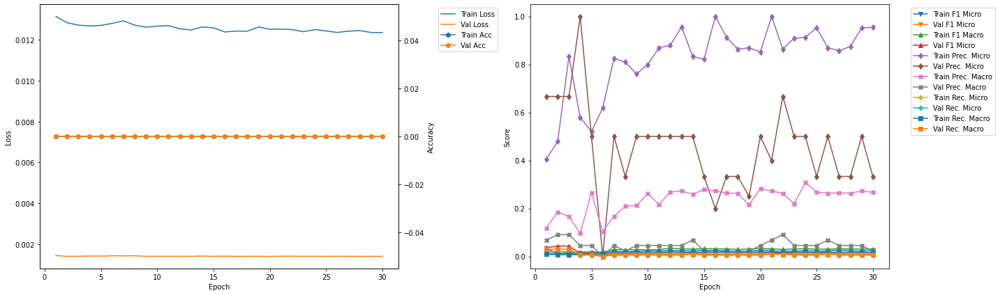

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.75
Train Loss: 0.0131 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0557 	Validation F1 Micro: 0.0288
Train F1 Marco: 0.0314 	Validation F1 Macro: 0.0464
Train Precision Mirco: 0.593 	Validation Precision Micro: 0.4286
Train Precision Marco: 0.2685 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.0292 	Validation Recall Micro: 0.0149
Train Recall Marco: 0.0176 	Validation Recall Macro: 0.0325

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.92
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0269 	Validation F1 Micro: 0.0293
Train F1 Marco: 0.0344 	Validation F1 Macro: 0.0474
Train Precision Mirco: 0.6316 	Validation Precision Micro: 0.75
Train Precision Marco: 0.3659 	Validation Precision Macro: 0.1136
Train Recall Mirco: 0.0137 	Validation 

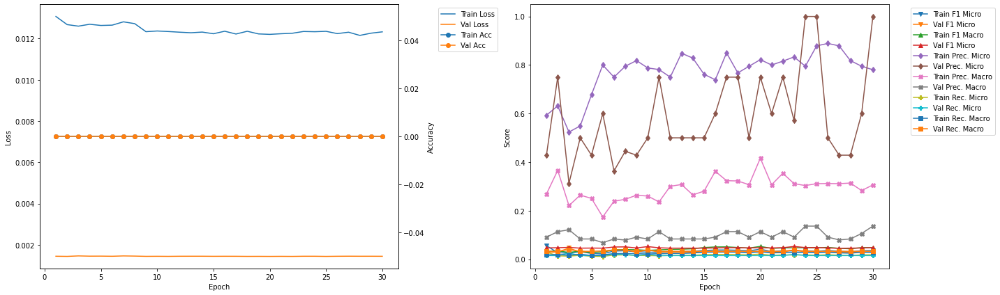

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 20.95
Train Loss: 0.0135 	Validation Loss: 0.0013
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0941 	Validation F1 Micro: 0.044
Train F1 Marco: 0.0594 	Validation F1 Macro: 0.0487
Train Precision Mirco: 0.4493 	Validation Precision Micro: 1.0
Train Precision Marco: 0.2747 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.0526 	Validation Recall Micro: 0.0225
Train Recall Marco: 0.0394 	Validation Recall Macro: 0.0333

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.12
Train Loss: 0.0127 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0321 	Validation F1 Micro: 0.0538
Train F1 Marco: 0.0427 	Validation F1 Macro: 0.0487
Train Precision Mirco: 0.7838 	Validation Precision Micro: 0.625
Train Precision Marco: 0.2393 	Validation Precision Macro: 0.0682
Train Recall Mirco: 0.0164 	Validation

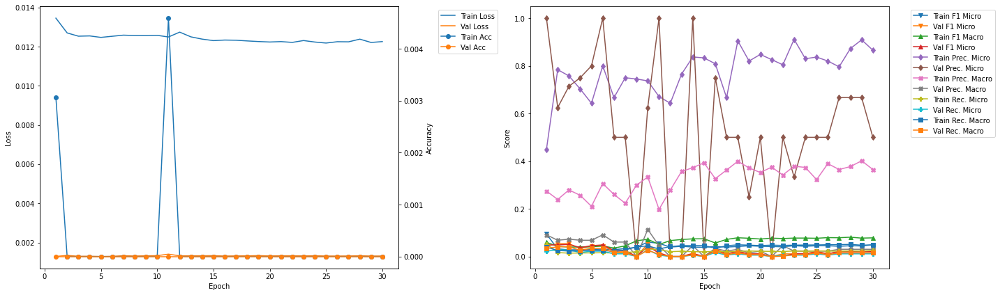

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.14
Train Loss: 0.0135 	Validation Loss: 0.0014
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1239 	Validation F1 Micro: 0.0664
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0563
Train Precision Mirco: 0.3828 	Validation Precision Micro: 0.7778
Train Precision Marco: 0.3302 	Validation Precision Macro: 0.2273
Train Recall Mirco: 0.0739 	Validation Recall Micro: 0.0347
Train Recall Marco: 0.0481 	Validation Recall Macro: 0.0341

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.31
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0369 	Validation F1 Micro: 0.0651
Train F1 Marco: 0.0609 	Validation F1 Macro: 0.0452
Train Precision Mirco: 0.7333 	Validation Precision Micro: 0.5385
Train Precision Marco: 0.2665 	Validation Precision Macro: 0.1591
Train Recall Mirco: 0.0189 	Valid

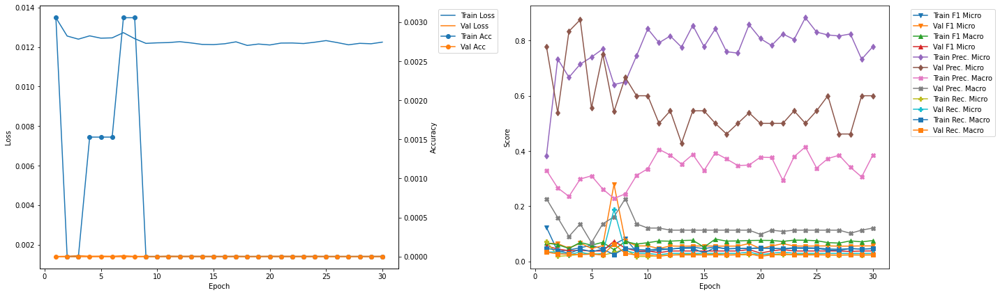

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.34
Train Loss: 0.0139 	Validation Loss: 0.0014
Train Accuracy: 0.0046 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1419 	Validation F1 Micro: 0.1408
Train F1 Marco: 0.0629 	Validation F1 Macro: 0.0241
Train Precision Mirco: 0.4126 	Validation Precision Micro: 0.5172
Train Precision Marco: 0.2145 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.0856 	Validation Recall Micro: 0.0815
Train Recall Marco: 0.046 	Validation Recall Macro: 0.0192

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.51
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0768 	Validation F1 Micro: 0.0317
Train F1 Marco: 0.0802 	Validation F1 Macro: 0.0145
Train Precision Mirco: 0.6429 	Validation Precision Micro: 0.6
Train Precision Marco: 0.2555 	Validation Precision Macro: 0.1136
Train Recall Mirco: 0.0408 	Valida

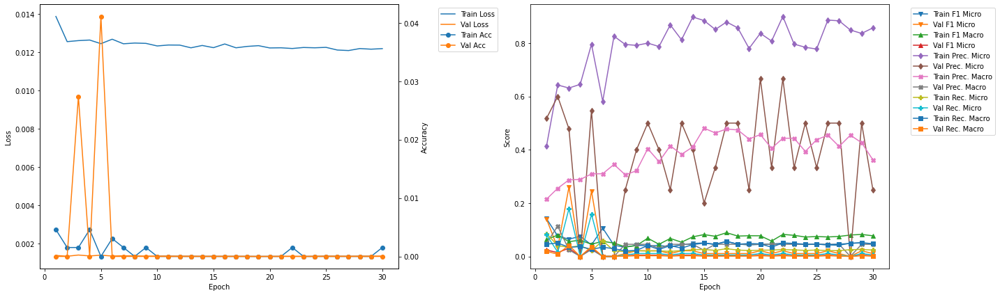

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.53
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0867 	Validation F1 Micro: 0.0212
Train F1 Marco: 0.0562 	Validation F1 Macro: 0.0249
Train Precision Mirco: 0.6308 	Validation Precision Micro: 0.5
Train Precision Marco: 0.3195 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.0465 	Validation Recall Micro: 0.0108
Train Recall Marco: 0.033 	Validation Recall Macro: 0.0163

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.71
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0409 	Validation F1 Micro: 0.0697
Train F1 Marco: 0.0431 	Validation F1 Macro: 0.0125
Train Precision Mirco: 0.8043 	Validation Precision Micro: 0.4375
Train Precision Marco: 0.3098 	Validation Precision Macro: 0.0289
Train Recall Mirco: 0.021 	Validat

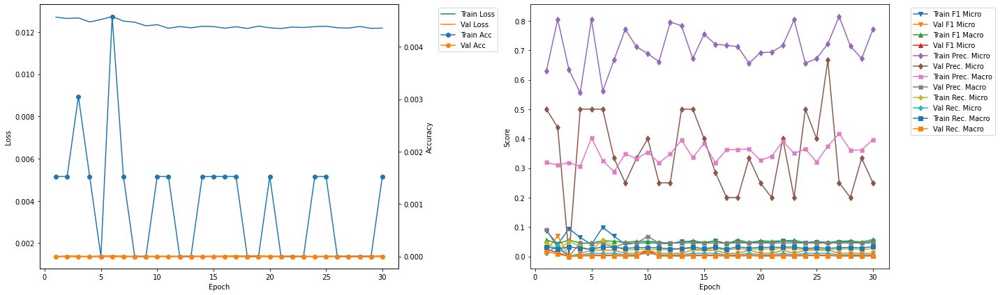

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 41.72
Train Loss: 0.0129 	Validation Loss: 0.0014
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1056 	Validation F1 Micro: 0.0574
Train F1 Marco: 0.0474 	Validation F1 Macro: 0.0657
Train Precision Mirco: 0.6048 	Validation Precision Micro: 0.8571
Train Precision Marco: 0.2613 	Validation Precision Macro: 0.2727
Train Recall Mirco: 0.0579 	Validation Recall Micro: 0.0297
Train Recall Marco: 0.0291 	Validation Recall Macro: 0.0395

Epoch 2 	Learning Rate: 0.01 	Time (min): 41.89
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0061 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1106 	Validation F1 Micro: 0.066
Train F1 Marco: 0.0533 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.5632 	Validation Precision Micro: 0.7
Train Precision Marco: 0.2875 	Validation Precision Macro: 0.2348
Train Recall Mirco: 0.0613 	Valida

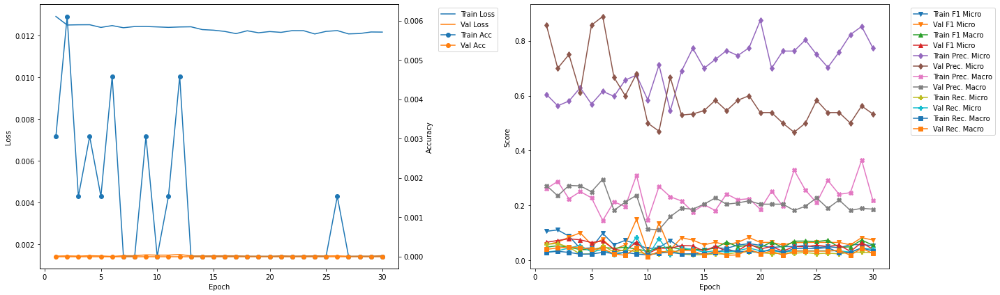

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 46.91
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1182 	Validation F1 Micro: 0.0196
Train F1 Marco: 0.0792 	Validation F1 Macro: 0.0202
Train Precision Mirco: 0.4007 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.2516 	Validation Precision Macro: 0.0682
Train Recall Mirco: 0.0693 	Validation Recall Micro: 0.01
Train Recall Marco: 0.0542 	Validation Recall Macro: 0.0122

Epoch 2 	Learning Rate: 0.01 	Time (min): 47.08
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0482 	Validation F1 Micro: 0.0294
Train F1 Marco: 0.0457 	Validation F1 Macro: 0.0235
Train Precision Mirco: 0.5432 	Validation Precision Micro: 1.0
Train Precision Marco: 0.2592 	Validation Precision Macro: 0.1364
Train Recall Mirco: 0.0252 	Validatio

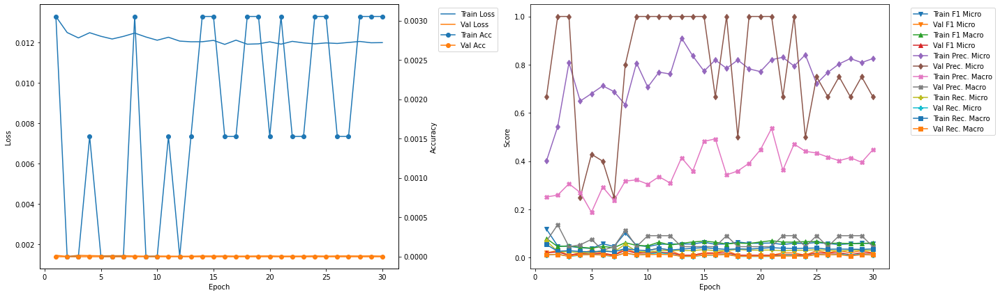

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 7
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0622 	Validation F1 Micro: 0.2794
Train F1 Marco: 0.0428 	Validation F1 Macro: 0.0738
Train Precision Mirco: 0.6404 	Validation Precision Micro: 0.5429
Train Precision Marco: 0.2282 	Validation Precision Macro: 0.1619
Train Recall Mirco: 0.0327 	Validation Recall Micro: 0.1881
Train Recall Marco: 0.0255 	Validation Recall Macro: 0.0635


In [23]:
densenet169LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = densenet169LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.009524).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.0173 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.06 	Validation F1 Micro: 0.0095
Train F1 Marco: 0.0465 	Validation F1 Macro: 0.0114
Train Precision Mirco: 0.132 	Validation Precision Micro: 0.0769
Train Precision Marco: 0.1313 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0389 	Validation Recall Micro: 0.0051
Train Recall Marco: 0.0387 	Validation Recall Macro: 0.0065

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.39
Train Loss: 0.0128 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0056 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0055 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1852 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0134 	Valida

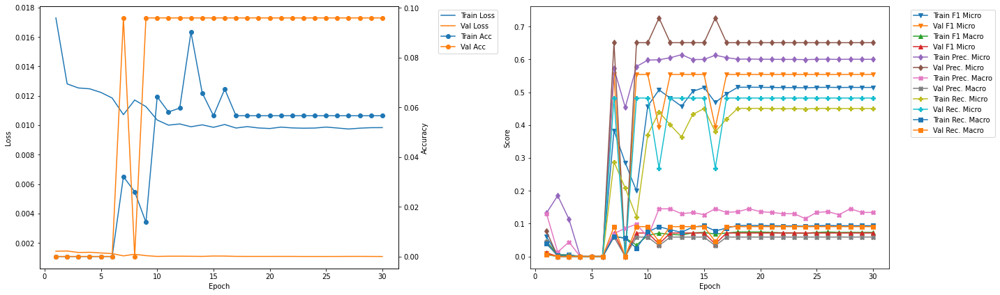

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.83
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4934 	Validation F1 Micro: 0.5192
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6118 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.1235 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4133 	Validation Recall Micro: 0.456
Train Recall Marco: 0.0839 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.01
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4914 	Validation F1 Micro: 0.5192
Train F1 Marco: 0.0702 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.1227 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4156 	

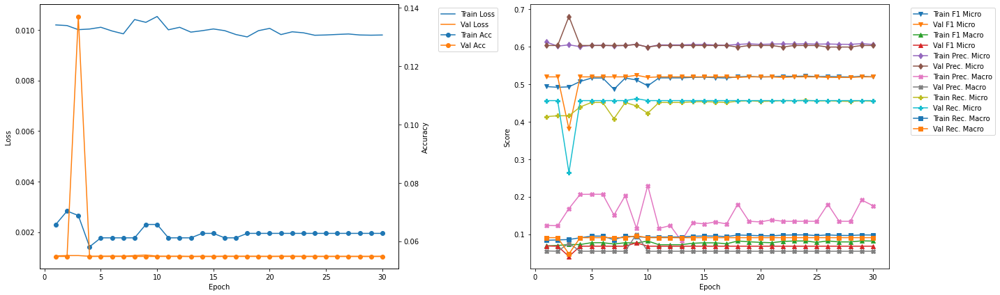

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.43
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4889 	Validation F1 Micro: 0.523
Train F1 Marco: 0.0841 	Validation F1 Macro: 0.0696
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.1535 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4115 	Validation Recall Micro: 0.4505
Train Recall Marco: 0.0891 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.62
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0535 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4783 	Validation F1 Micro: 0.3768
Train F1 Marco: 0.0839 	Validation F1 Macro: 0.0396
Train Precision Mirco: 0.5986 	Validation Precision Micro: 0.7027
Train Precision Marco: 0.2482 	Validation Precision Macro: 0.0772
Train Recall Mirco: 0.3983

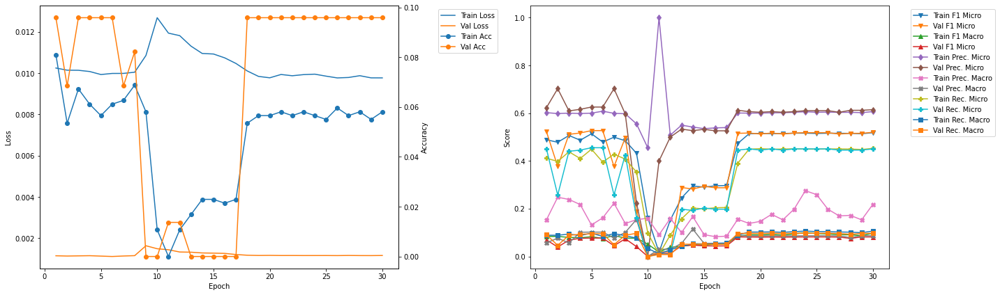

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.03
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4437 	Validation F1 Micro: 0.0299
Train F1 Marco: 0.0825 	Validation F1 Macro: 0.0149
Train Precision Mirco: 0.5801 	Validation Precision Micro: 0.375
Train Precision Marco: 0.1266 	Validation Precision Macro: 0.0636
Train Recall Mirco: 0.3592 	Validation Recall Micro: 0.0155
Train Recall Marco: 0.0813 	Validation Recall Macro: 0.0084

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.22
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0902 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.439 	Validation F1 Micro: 0.5133
Train F1 Marco: 0.09 	Validation F1 Macro: 0.0787
Train Precision Mirco: 0.6052 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.216 	Validation Precision Macro: 0.1001
Train Recall Mirco: 0.3444 	Val

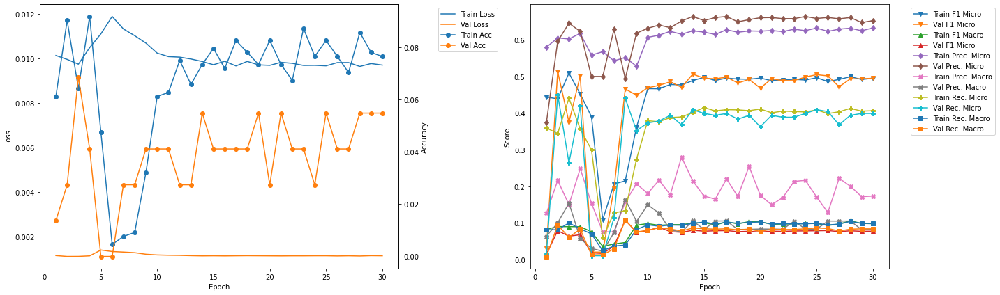

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.64
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.486 	Validation F1 Micro: 0.4431
Train F1 Marco: 0.093 	Validation F1 Macro: 0.0821
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.5606
Train Precision Marco: 0.1725 	Validation Precision Macro: 0.1202
Train Recall Mirco: 0.408 	Validation Recall Micro: 0.3663
Train Recall Marco: 0.0939 	Validation Recall Macro: 0.0906

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.82
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4993 	Validation F1 Micro: 0.4661
Train F1 Marco: 0.0944 	Validation F1 Macro: 0.0902
Train Precision Mirco: 0.6204 	Validation Precision Micro: 0.5766
Train Precision Marco: 0.2393 	Validation Precision Macro: 0.12
Train Recall Mirco: 0.4178 	Val

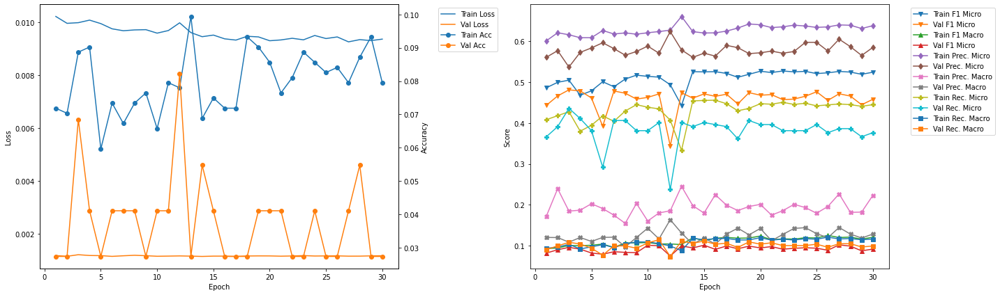

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.24
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5164 	Validation F1 Micro: 0.5141
Train F1 Marco: 0.1156 	Validation F1 Macro: 0.1147
Train Precision Mirco: 0.6049 	Validation Precision Micro: 0.5899
Train Precision Marco: 0.2026 	Validation Precision Macro: 0.1203
Train Recall Mirco: 0.4505 	Validation Recall Micro: 0.4556
Train Recall Marco: 0.1156 	Validation Recall Macro: 0.1221

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.43
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.081 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4922 	Validation F1 Micro: 0.5257
Train F1 Marco: 0.1098 	Validation F1 Macro: 0.1535
Train Precision Mirco: 0.6296 	Validation Precision Micro: 0.5762
Train Precision Marco: 0.2324 	Validation Precision Macro: 0.2019
Train Recall Mirco: 0.4041 

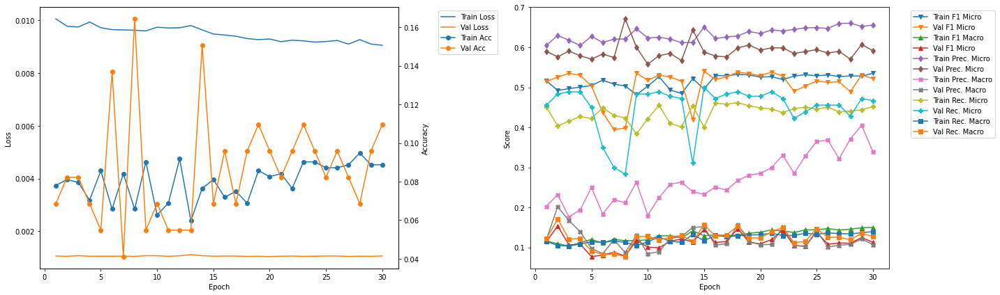

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.553936 --> 0.564972).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 33.85
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0856 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4919 	Validation F1 Micro: 0.565
Train F1 Marco: 0.123 	Validation F1 Macro: 0.143
Train Precision Mirco: 0.6175 	Validation Precision Micro: 0.6711
Train Precision Marco: 0.1894 	Validation Precision Macro: 0.1964
Train Recall Mirco: 0.4087 	Validation Recall Micro: 0.4878
Train Recall Marco: 0.1132 	Validation Recall Macro: 0.14

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.04
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4897 	Validation F1 Micro: 0.522
Train F1 Marco: 0.1206 	Validation F1 Macro: 0.1107
Train Precision Mirco: 0.6094 	Validation Precision Micro: 0.6544
Train Precision M

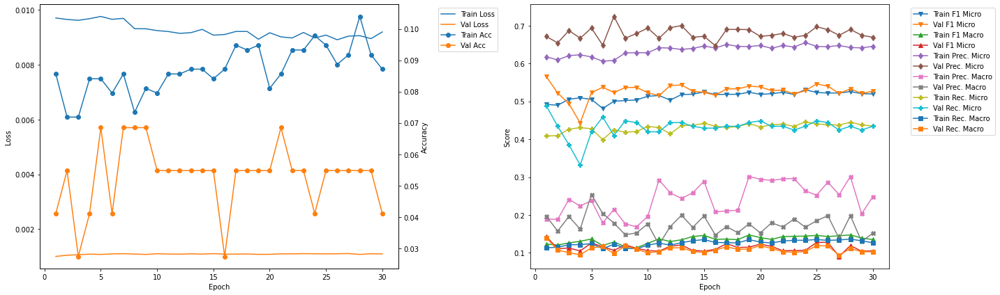

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.46
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0779 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5167 	Validation F1 Micro: 0.5091
Train F1 Marco: 0.1198 	Validation F1 Macro: 0.1003
Train Precision Mirco: 0.6184 	Validation Precision Micro: 0.5874
Train Precision Marco: 0.1602 	Validation Precision Macro: 0.1655
Train Recall Mirco: 0.4438 	Validation Recall Micro: 0.4492
Train Recall Marco: 0.1153 	Validation Recall Macro: 0.1084

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.64
Train Loss: 0.0095 	Validation Loss: 0.001
Train Accuracy: 0.0672 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5019 	Validation F1 Micro: 0.5167
Train F1 Marco: 0.1262 	Validation F1 Macro: 0.1138
Train Precision Mirco: 0.6314 	Validation Precision Micro: 0.5986
Train Precision Marco: 0.184 	Validation Precision Macro: 0.1683
Train Recall Mirco: 0.4165 

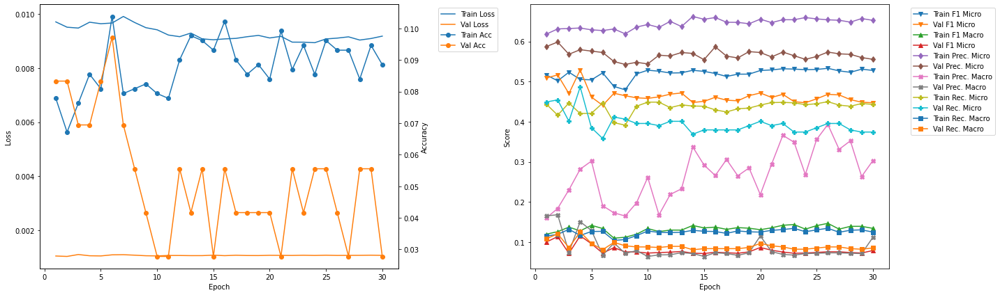

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.05
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0977 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4957 	Validation F1 Micro: 0.5269
Train F1 Marco: 0.1298 	Validation F1 Macro: 0.119
Train Precision Mirco: 0.6171 	Validation Precision Micro: 0.6197
Train Precision Marco: 0.2337 	Validation Precision Macro: 0.1772
Train Recall Mirco: 0.4142 	Validation Recall Micro: 0.4583
Train Recall Marco: 0.117 	Validation Recall Macro: 0.1259

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.24
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0748 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5143 	Validation F1 Micro: 0.414
Train F1 Marco: 0.1371 	Validation F1 Macro: 0.0944
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.6344
Train Precision Marco: 0.2651 	Validation Precision Macro: 0.1252
Train Recall Mirco: 0.4456 

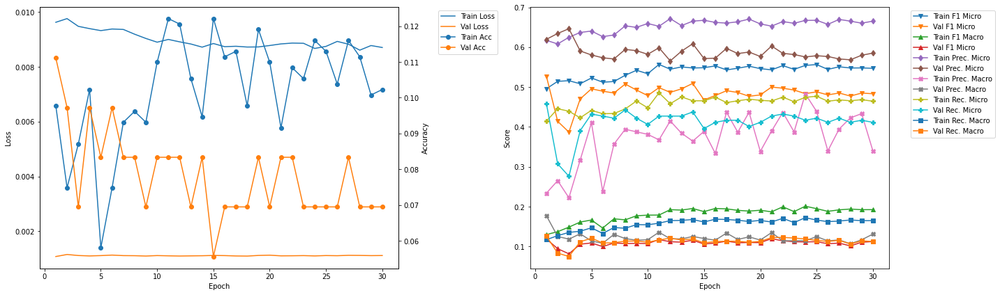

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.65
Train Loss: 0.0095 	Validation Loss: 0.0011
Train Accuracy: 0.1008 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5227 	Validation F1 Micro: 0.5148
Train F1 Marco: 0.1631 	Validation F1 Macro: 0.1614
Train Precision Mirco: 0.6417 	Validation Precision Micro: 0.6127
Train Precision Marco: 0.438 	Validation Precision Macro: 0.2227
Train Recall Mirco: 0.4409 	Validation Recall Micro: 0.4439
Train Recall Marco: 0.1409 	Validation Recall Macro: 0.1555

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.83
Train Loss: 0.0092 	Validation Loss: 0.0011
Train Accuracy: 0.1069 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5269 	Validation F1 Micro: 0.483
Train F1 Marco: 0.1674 	Validation F1 Macro: 0.1273
Train Precision Mirco: 0.6413 	Validation Precision Micro: 0.6142
Train Precision Marco: 0.3235 	Validation Precision Macro: 0.1543
Train Recall Mirco: 0.447

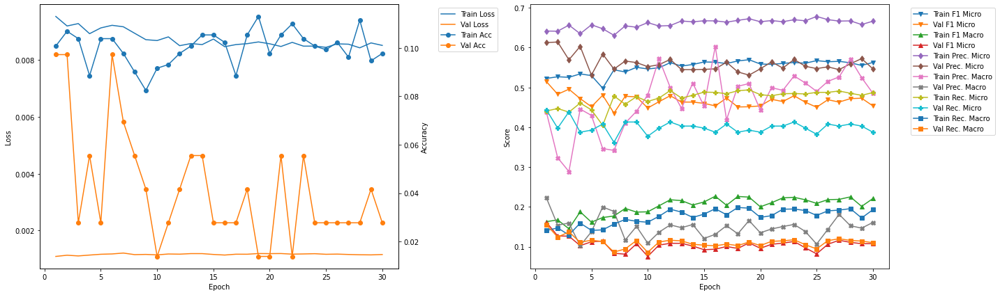

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 1
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0856 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4919 	Validation F1 Micro: 0.565
Train F1 Marco: 0.123 	Validation F1 Macro: 0.143
Train Precision Mirco: 0.6175 	Validation Precision Micro: 0.6711
Train Precision Marco: 0.1894 	Validation Precision Macro: 0.1964
Train Recall Mirco: 0.4087 	Validation Recall Micro: 0.4878
Train Recall Marco: 0.1132 	Validation Recall Macro: 0.14


In [24]:
densenet201LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = densenet201LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.262391).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0164 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0564 	Validation F1 Micro: 0.2624
Train F1 Marco: 0.0391 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.1587 	Validation Precision Micro: 0.3082
Train Precision Marco: 0.1154 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.0343 	Validation Recall Micro: 0.2284
Train Recall Marco: 0.0375 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.39
Train Loss: 0.013 	Validation Loss: 0.0014
Train Accuracy: 0.0199 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0358 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3282 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0779 	V

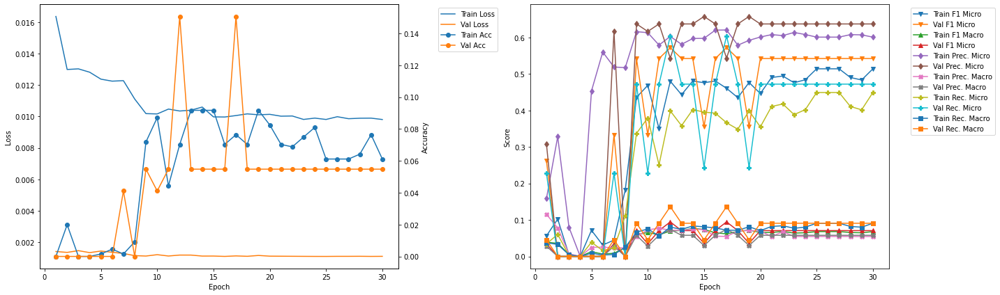

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.9
Train Loss: 0.0138 	Validation Loss: 0.0014
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.043 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0192 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2808 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0756 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0233 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0133 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.09
Train Loss: 0.013 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

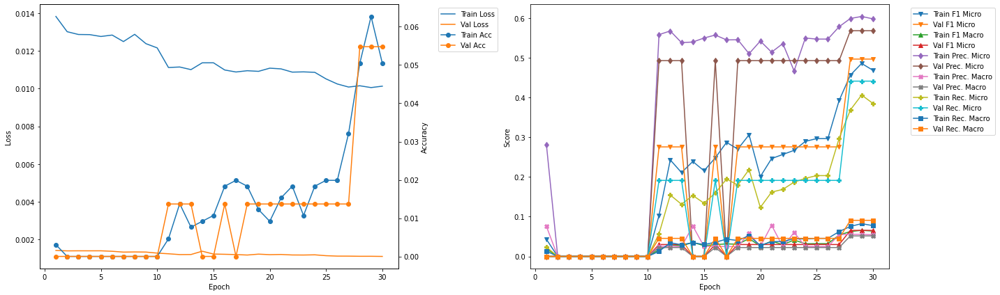

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.55
Train Loss: 0.0113 	Validation Loss: 0.0011
Train Accuracy: 0.0183 	Validation Accuracy: 0.0
Train F1 Mirco: 0.295 	Validation F1 Micro: 0.3218
Train F1 Marco: 0.0576 	Validation F1 Macro: 0.0332
Train Precision Mirco: 0.5034 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0809 	Validation Precision Macro: 0.0262
Train Recall Mirco: 0.2086 	Validation Recall Micro: 0.2234
Train Recall Marco: 0.052 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.74
Train Loss: 0.0105 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.4543 	Validation F1 Micro: 0.3908
Train F1 Marco: 0.0628 	Validation F1 Macro: 0.0374
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0318
Train Recall Mirco: 0.3633 	V

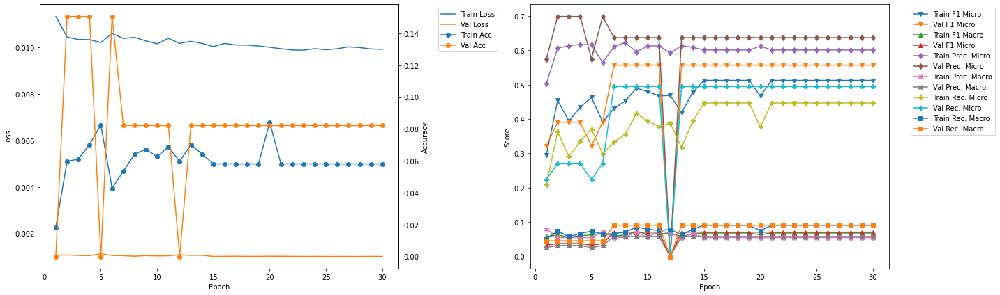

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.2
Train Loss: 0.0105 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4534 	Validation F1 Micro: 0.5279
Train F1 Marco: 0.0698 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6021 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0744 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3636 	Validation Recall Micro: 0.4615
Train Recall Marco: 0.0742 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.39
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4872 	Validation F1 Micro: 0.3657
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.6056 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.4075

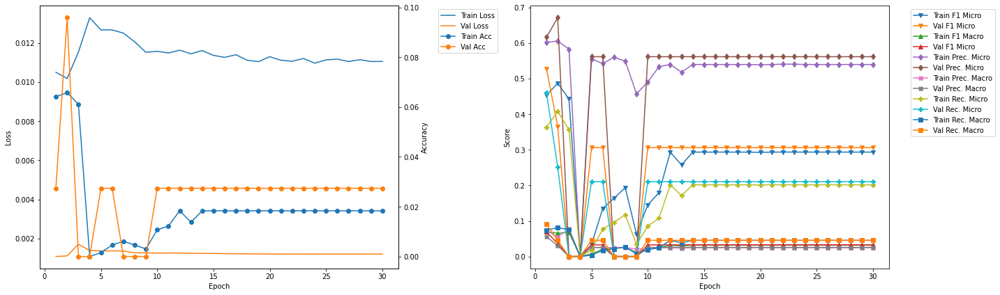

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.84
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0076 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1386 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0289 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4431 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0932 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0821 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0202 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.03
Train Loss: 0.0114 	Validation Loss: 0.0012
Train Accuracy: 0.0122 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.2195 	Validation F1 Micro: 0.2921
Train F1 Marco: 0.0267 	Validation F1 Macro: 0.0317
Train Precision Mirco: 0.5115 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0232 	Validation Precision Macro: 0.0243
Train Recall Mirco: 0.1398 	Validation Recall

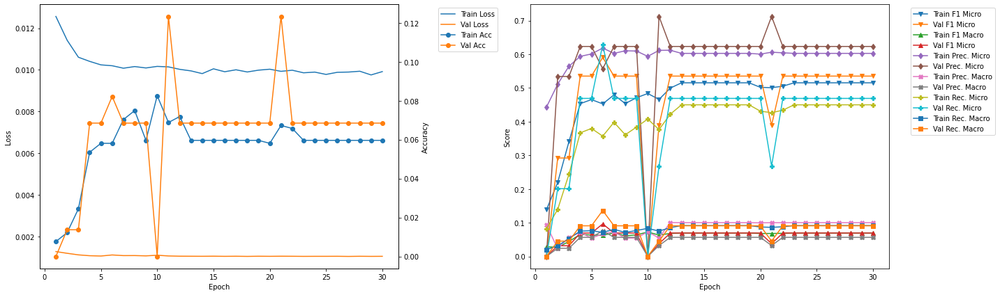

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.51
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4385 	Validation F1 Micro: 0.513
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0686
Train Precision Mirco: 0.5986 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.1161 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3459 	Validation Recall Micro: 0.4428
Train Recall Marco: 0.0708 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.7
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4861 	Validation F1 Micro: 0.513
Train F1 Marco: 0.0662 	Validation F1 Macro: 0.0686
Train Precision Mirco: 0.6091 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.1 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4044 	Va

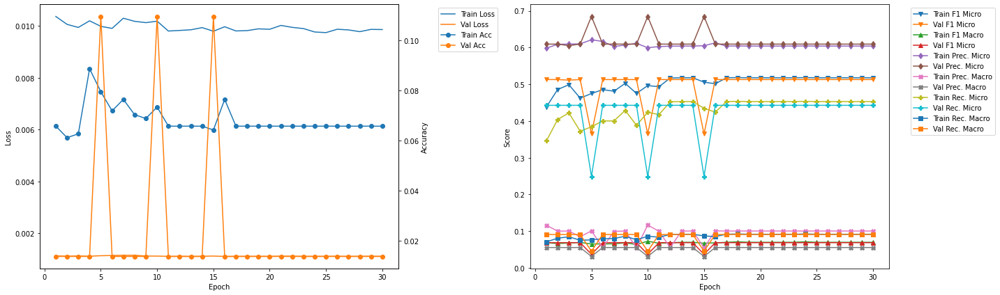

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.16
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4677 	Validation F1 Micro: 0.4793
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0647
Train Precision Mirco: 0.6213 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.1184 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.3749 	Validation Recall Micro: 0.4219
Train Recall Marco: 0.0755 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.35
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5025 	Validation F1 Micro: 0.4793
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0647
Train Precision Mirco: 0.6086 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.1004 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.42

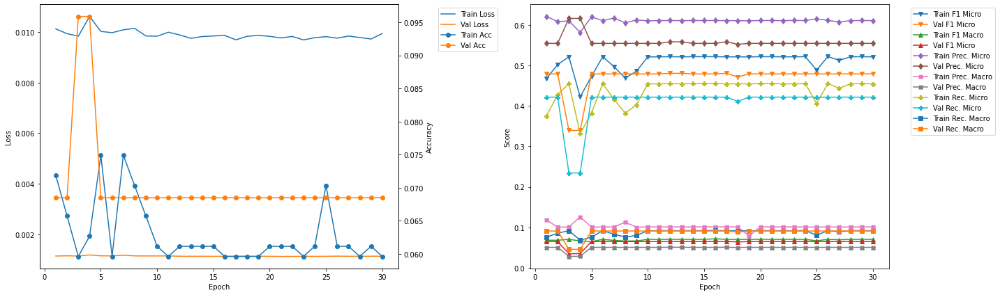

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.8
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4817 	Validation F1 Micro: 0.5133
Train F1 Marco: 0.0711 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.5988 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.1159 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.403 	Validation Recall Micro: 0.4462
Train Recall Marco: 0.0819 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.99
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4685 	Validation F1 Micro: 0.5133
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6211 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.1006 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3761 	

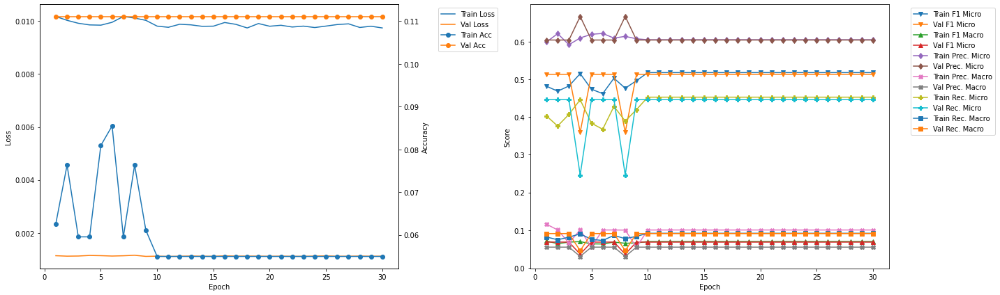

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.45
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0718 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4726 	Validation F1 Micro: 0.4985
Train F1 Marco: 0.0722 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6004 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.1176 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.3897 	Validation Recall Micro: 0.4315
Train Recall Marco: 0.0794 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.63
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0611 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4992 	Validation F1 Micro: 0.3346
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.035
Train Precision Mirco: 0.6102 	Validation Precision Micro: 0.625
Train Precision Marco: 0.1004 	Validation Precision Macro: 0.0284
Train Recall Mirco: 0.4223 	

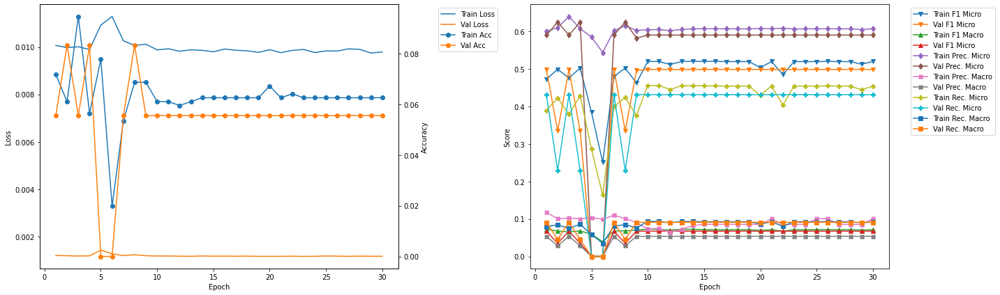

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.08
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4637 	Validation F1 Micro: 0.5058
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0681
Train Precision Mirco: 0.5975 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.088 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3789 	Validation Recall Micro: 0.435
Train Recall Marco: 0.0767 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.27
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4631 	Validation F1 Micro: 0.3676
Train F1 Marco: 0.069 	Validation F1 Macro: 0.0373
Train Precision Mirco: 0.5953 	Validation Precision Micro: 0.6944
Train Precision Marco: 0.1144 	Validation Precision Macro: 0.0316
Train Recall Mirco: 0.3789 

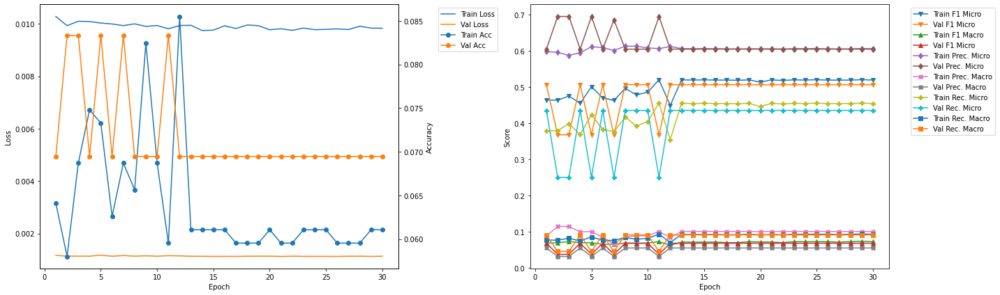

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 5 	Epoch: 6
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4528 	Validation F1 Micro: 0.5908
Train F1 Marco: 0.0628 	Validation F1 Macro: 0.0966
Train Precision Mirco: 0.6186 	Validation Precision Micro: 0.5571
Train Precision Marco: 0.067 	Validation Precision Macro: 0.076
Train Recall Mirco: 0.3571 	Validation Recall Micro: 0.6289
Train Recall Marco: 0.0714 	Validation Recall Macro: 0.1364


In [25]:
vgg11bnLSTM_700_1_50_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.0184 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0754 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0482 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1212 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1218 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0547 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0416 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.4
Train Loss: 0.0138 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

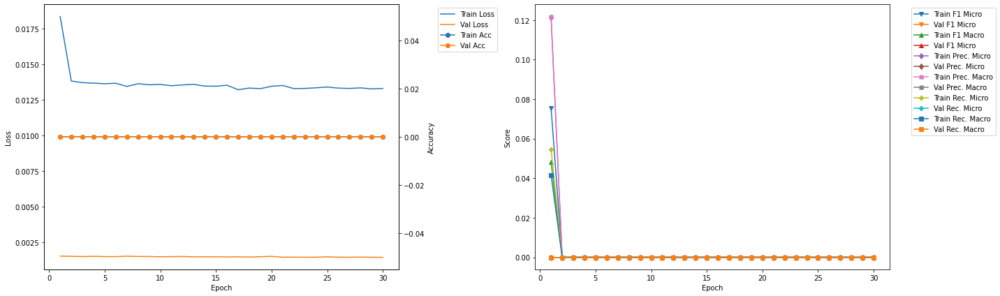

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.25
Train Loss: 0.015 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0618 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0407 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1675 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1218 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0379 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0285 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.45
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

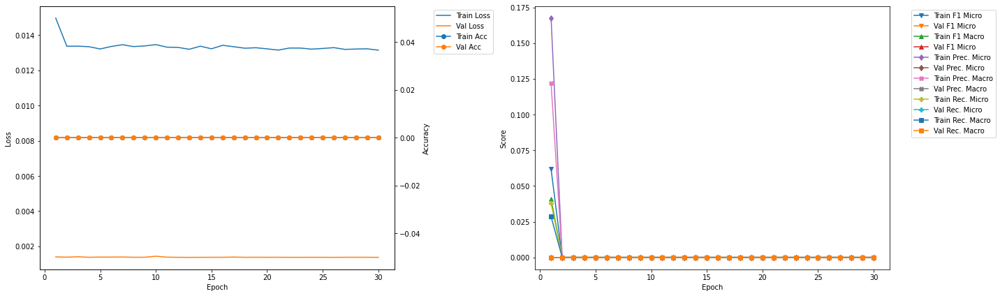

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.3
Train Loss: 0.0136 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.5
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

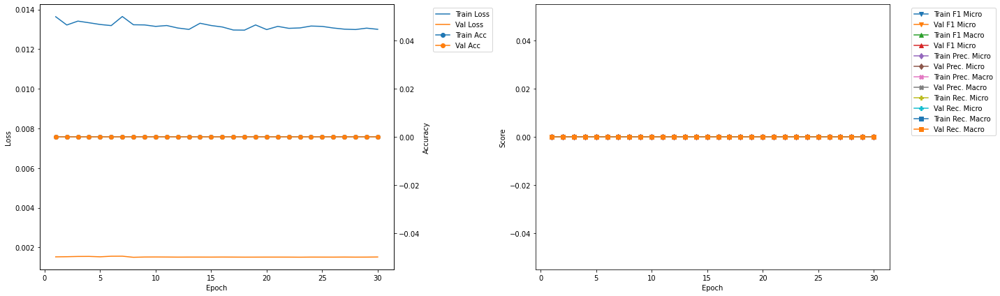

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.35
Train Loss: 0.0135 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0044 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0048 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.08 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0073 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0039 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.55
Train Loss: 0.0121 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0964 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0169 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5167 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0688 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0531 	Validation Recall Micro: 0.0
Train Recal

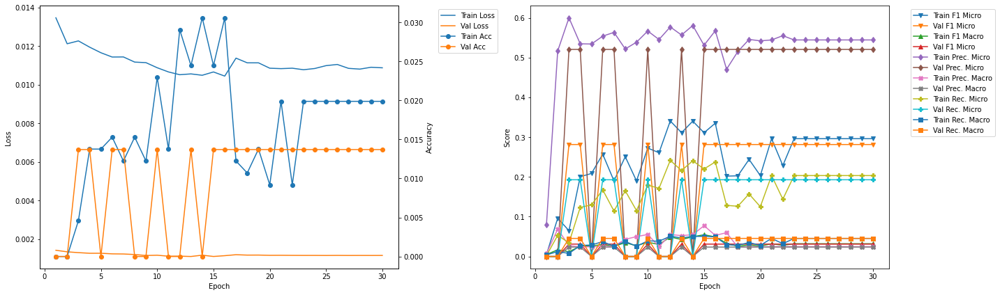

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.281481 --> 0.343284).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 24.44
Train Loss: 0.0116 	Validation Loss: 0.0012
Train Accuracy: 0.0153 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2287 	Validation F1 Micro: 0.3433
Train F1 Marco: 0.0336 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.5119 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.043 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.1473 	Validation Recall Micro: 0.2359
Train Recall Marco: 0.0358 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.64
Train Loss: 0.0109 	Validation Loss: 0.0012
Train Accuracy: 0.0199 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2576 	Validation F1 Micro: 0.3433
Train F1 Marco: 0.0299 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.5361 	Validation Precision Micro: 0.6301
Train Precision M

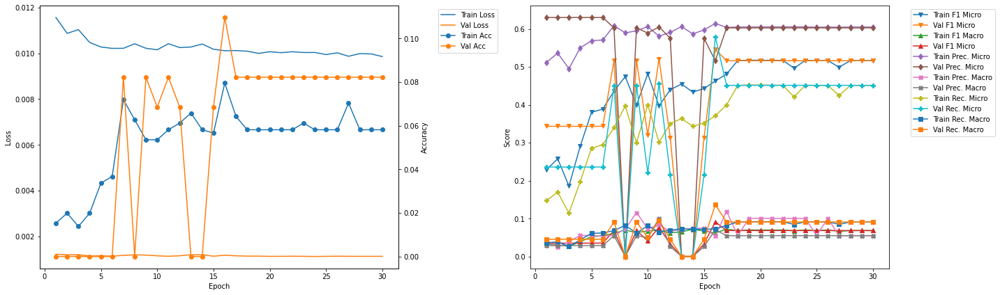

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.54
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0887 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4741 	Validation F1 Micro: 0.5058
Train F1 Marco: 0.0763 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6129 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0768 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.3865 	Validation Recall Micro: 0.4394
Train Recall Marco: 0.0806 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.74
Train Loss: 0.0111 	Validation Loss: 0.0012
Train Accuracy: 0.0443 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4061 	Validation F1 Micro: 0.2362
Train F1 Marco: 0.0728 	Validation F1 Macro: 0.0277
Train Precision Mirco: 0.5309 	Validation Precision Micro: 0.4384
Train Precision Marco: 0.0892 	Validation Precision Macro: 0.0199
Train Recall Mirco: 0.32

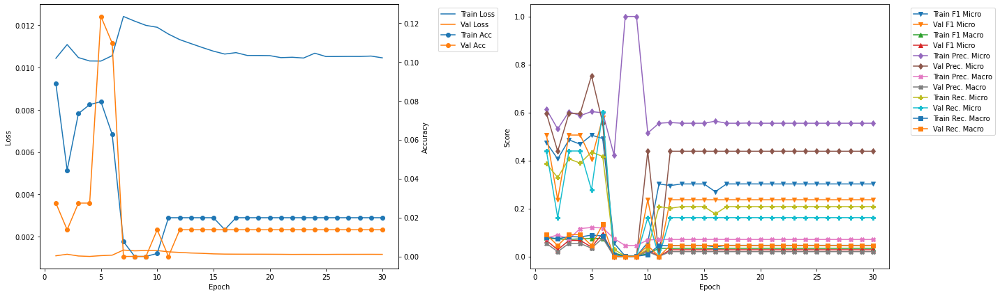

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.6
Train Loss: 0.0127 	Validation Loss: 0.0013
Train Accuracy: 0.0122 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.2241 	Validation F1 Micro: 0.3143
Train F1 Marco: 0.0459 	Validation F1 Macro: 0.0342
Train Precision Mirco: 0.4483 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.1306 	Validation Precision Macro: 0.0274
Train Recall Mirco: 0.1494 	Validation Recall Micro: 0.2126
Train Recall Marco: 0.0398 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.8
Train Loss: 0.0107 	Validation Loss: 0.0012
Train Accuracy: 0.0199 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.2932 	Validation F1 Micro: 0.3143
Train F1 Marco: 0.0332 	Validation F1 Macro: 0.0342
Train Precision Mirco: 0.5367 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0698 	Validation Precision Macro: 0.0274
Train Recall Mirco: 0.2017

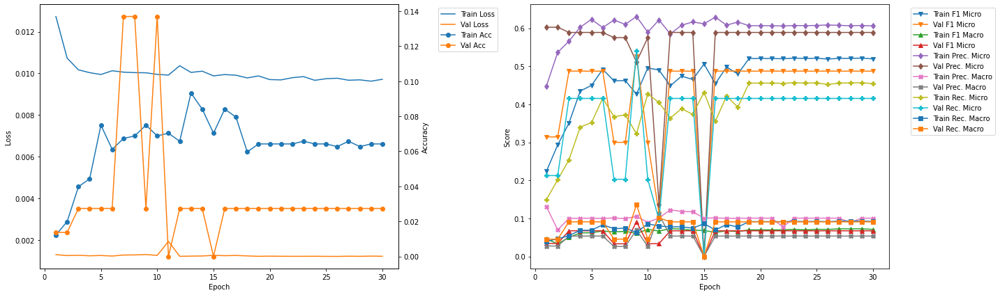

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.65
Train Loss: 0.0105 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4454 	Validation F1 Micro: 0.5481
Train F1 Marco: 0.0775 	Validation F1 Macro: 0.0895
Train Precision Mirco: 0.5608 	Validation Precision Micro: 0.6483
Train Precision Marco: 0.1066 	Validation Precision Macro: 0.1042
Train Recall Mirco: 0.3694 	Validation Recall Micro: 0.4747
Train Recall Marco: 0.0795 	Validation Recall Macro: 0.1023

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.86
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4451 	Validation F1 Micro: 0.369
Train F1 Marco: 0.066 	Validation F1 Macro: 0.055
Train Precision Mirco: 0.6149 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.0852 	Validation Precision Macro: 0.0764
Train Recall Mirco: 0.3488 	

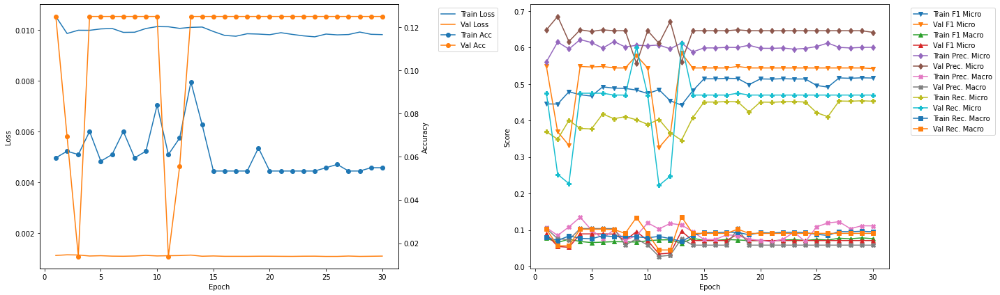

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.72
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0763 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.4807 	Validation F1 Micro: 0.4398
Train F1 Marco: 0.0855 	Validation F1 Macro: 0.0606
Train Precision Mirco: 0.5847 	Validation Precision Micro: 0.5069
Train Precision Marco: 0.1344 	Validation Precision Macro: 0.0461
Train Recall Mirco: 0.4082 	Validation Recall Micro: 0.3883
Train Recall Marco: 0.0889 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.92
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0672 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.511 	Validation F1 Micro: 0.4268
Train F1 Marco: 0.0731 	Validation F1 Macro: 0.0593
Train Precision Mirco: 0.6194 	Validation Precision Micro: 0.5
Train Precision Marco: 0.1211 	Validation Precision Macro: 0.0456
Train Recall Mirco: 0.4349 	Va

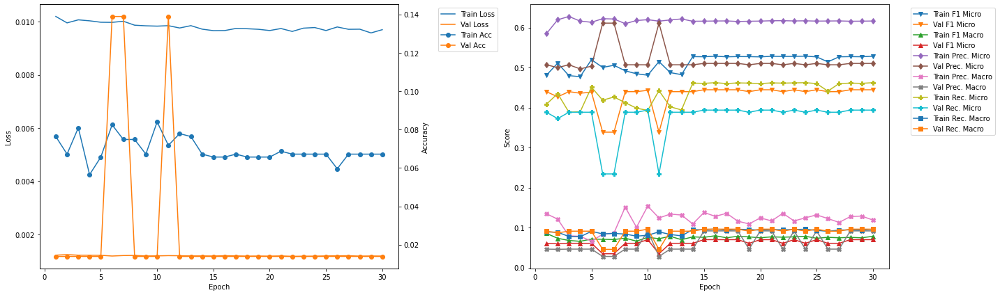

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.76
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0534 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4618 	Validation F1 Micro: 0.5465
Train F1 Marco: 0.0735 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.6212 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.148 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.3675 	Validation Recall Micro: 0.4815
Train Recall Marco: 0.0774 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.96
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4841 	Validation F1 Micro: 0.5465
Train F1 Marco: 0.0742 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.599 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.1203 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.406

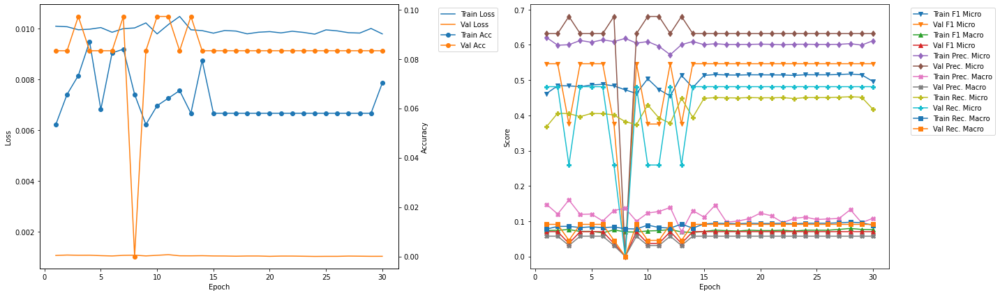

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 13
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0947 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4421 	Validation F1 Micro: 0.5845
Train F1 Marco: 0.0637 	Validation F1 Macro: 0.0968
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.5602
Train Precision Marco: 0.114 	Validation Precision Macro: 0.0764
Train Recall Mirco: 0.3459 	Validation Recall Micro: 0.6111
Train Recall Marco: 0.0689 	Validation Recall Macro: 0.1364


In [26]:
vgg16bnLSTM_700_1_50_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0191 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0648 	Validation F1 Micro: 0.0
Train F1 Marco: 0.053 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0934 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1219 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0496 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0595 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

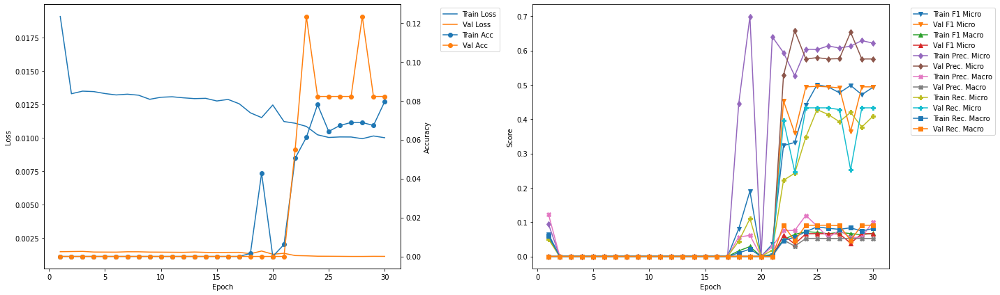

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.53
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0703 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.4605 	Validation F1 Micro: 0.3874
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.5987 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0737 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.3741 	Validation Recall Micro: 0.2722
Train Recall Marco: 0.0764 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.495575 --> 0.533742).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.76
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0872 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4629 	Validation F1 Micro: 0.5337
Train F1 Marco: 0.0626 	Validation F1 Macro: 0.0676
Train Precision Mirco: 0.6273 	Validation Precision Micro: 0.5959
Train Precision

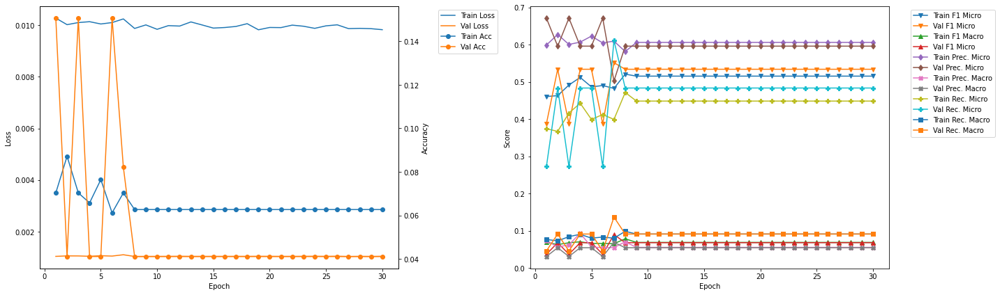

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.84
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4553 	Validation F1 Micro: 0.3895
Train F1 Marco: 0.069 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.5972 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.0716 	Validation Precision Macro: 0.0324
Train Recall Mirco: 0.3679 	Validation Recall Micro: 0.268
Train Recall Marco: 0.0752 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.551378 --> 0.595642).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.07
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.078 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4685 	Validation F1 Micro: 0.5956
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0962
Train Precision Mirco: 0.5966 	Validation Precision Micro: 0.5616
Train Precision

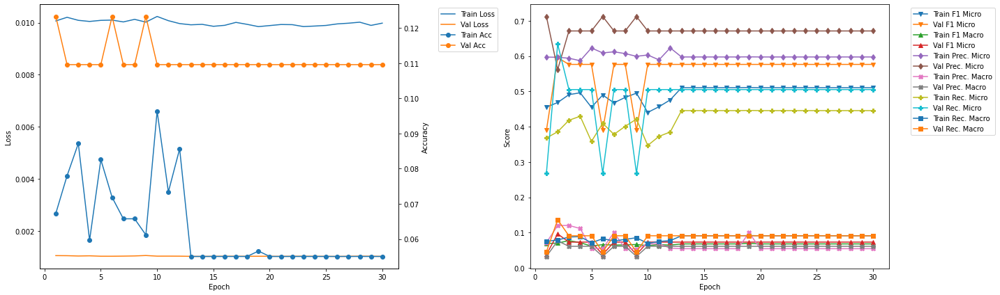

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.13
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.104 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4514 	Validation F1 Micro: 0.5333
Train F1 Marco: 0.0692 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.6066 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0731 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.3595 	Validation Recall Micro: 0.4486
Train Recall Marco: 0.0725 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.34
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4746 	Validation F1 Micro: 0.5333
Train F1 Marco: 0.0751 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.5989 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.076 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.393 

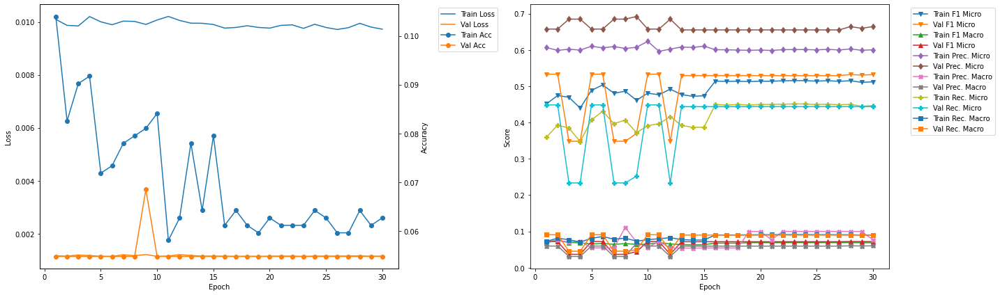

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.4
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4452 	Validation F1 Micro: 0.4847
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.5971 	Validation Precision Micro: 0.6124
Train Precision Marco: 0.0904 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3549 	Validation Recall Micro: 0.401
Train Recall Marco: 0.0711 	Validation Recall Macro: 0.0795

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.61
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.1644
Train F1 Mirco: 0.4287 	Validation F1 Micro: 0.363
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.5902 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0724 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.3366 

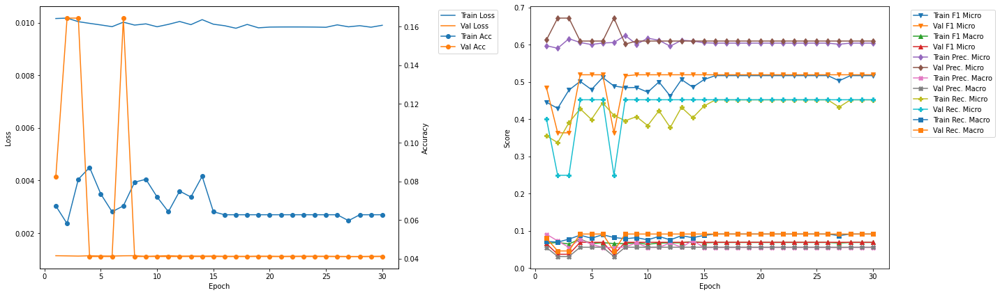

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.67
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4581 	Validation F1 Micro: 0.515
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6011 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0685 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3701 	Validation Recall Micro: 0.4574
Train Recall Marco: 0.0736 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.88
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5033 	Validation F1 Micro: 0.515
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6107 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4281 	Va

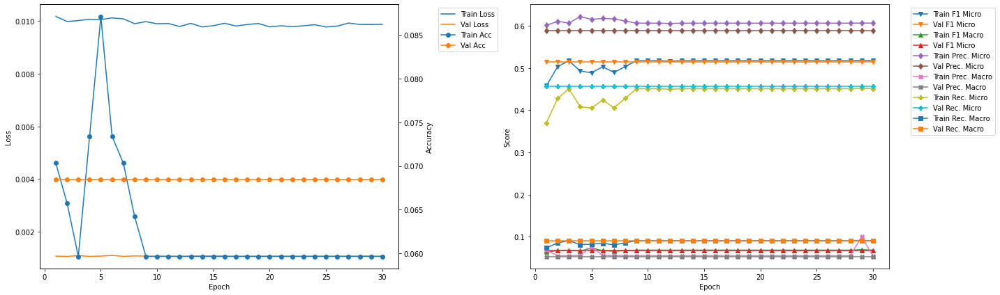

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.94
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4792 	Validation F1 Micro: 0.4762
Train F1 Marco: 0.0708 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.6203 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0777 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.3904 	Validation Recall Micro: 0.4211
Train Recall Marco: 0.0783 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.14
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4986 	Validation F1 Micro: 0.4716
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0636
Train Precision Mirco: 0.6247 	Validation Precision Micro: 0.5448
Train Precision Marco: 0.0563 	Validation Precision Macro: 0.0495
Train Recall Mirco: 0.4149

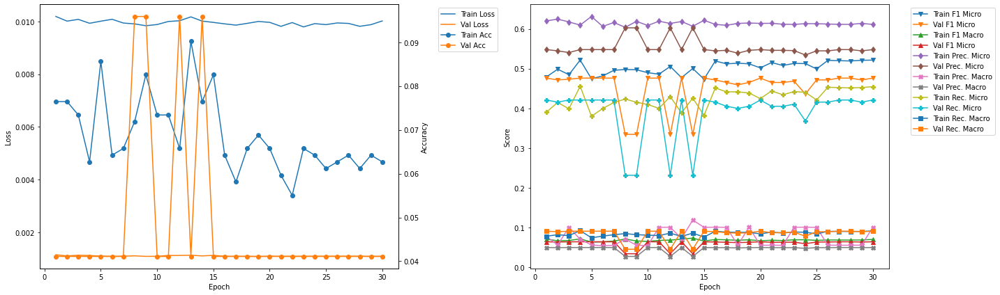

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.21
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4648 	Validation F1 Micro: 0.5455
Train F1 Marco: 0.0647 	Validation F1 Macro: 0.0794
Train Precision Mirco: 0.5934 	Validation Precision Micro: 0.6643
Train Precision Marco: 0.0658 	Validation Precision Macro: 0.1054
Train Recall Mirco: 0.382 	Validation Recall Micro: 0.4627
Train Recall Marco: 0.0763 	Validation Recall Macro: 0.0923

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.41
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4921 	Validation F1 Micro: 0.381
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0381
Train Precision Mirco: 0.6126 	Validation Precision Micro: 0.7222
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0328
Train Recall Mirco: 0.4112 

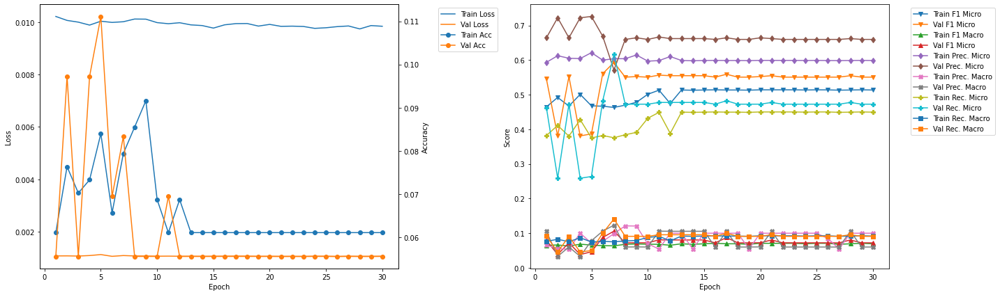

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.47
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0794 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4698 	Validation F1 Micro: 0.3383
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0446
Train Precision Mirco: 0.6161 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.1243 	Validation Precision Macro: 0.0732
Train Recall Mirco: 0.3797 	Validation Recall Micro: 0.2332
Train Recall Marco: 0.0761 	Validation Recall Macro: 0.0511

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.68
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5059 	Validation F1 Micro: 0.4807
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6121 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.431 

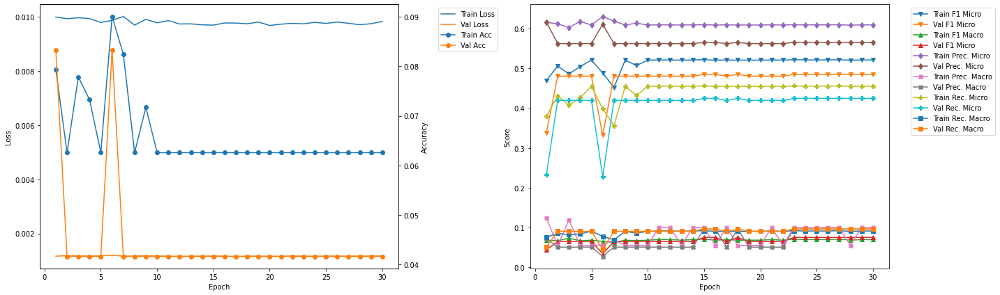

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 56.73
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0672 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5049 	Validation F1 Micro: 0.4927
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.073
Train Precision Mirco: 0.6172 	Validation Precision Micro: 0.5793
Train Precision Marco: 0.1011 	Validation Precision Macro: 0.0979
Train Recall Mirco: 0.4272 	Validation Recall Micro: 0.4286
Train Recall Marco: 0.0861 	Validation Recall Macro: 0.0947

Epoch 2 	Learning Rate: 0.01 	Time (min): 56.94
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4992 	Validation F1 Micro: 0.4927
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.073
Train Precision Mirco: 0.6107 	Validation Precision Micro: 0.5793
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0979
Train Recall Mirco: 0.422 	

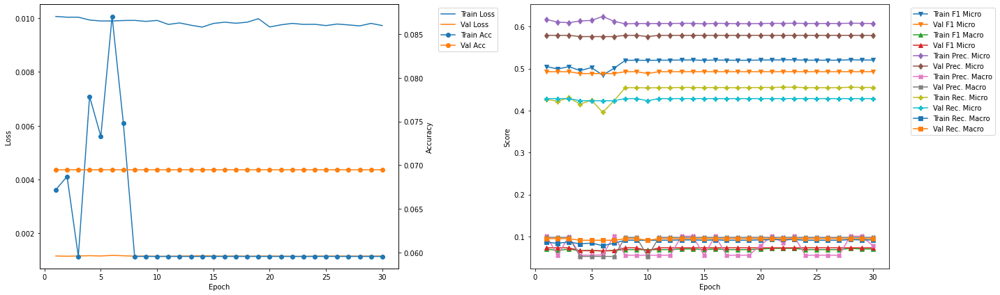

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 2
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.078 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4685 	Validation F1 Micro: 0.5956
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0962
Train Precision Mirco: 0.5966 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.1197 	Validation Precision Macro: 0.0766
Train Recall Mirco: 0.3856 	Validation Recall Micro: 0.634
Train Recall Marco: 0.0789 	Validation Recall Macro: 0.1364


In [27]:
vgg19bnLSTM_700_1_50_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_700_1_50')

In [28]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 7:41:17


## Training Summary

### Summary Table

In [29]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_700_1_50_best,
    'ResNet50' : resnet50LSTM_700_1_50_best,
    'ResNet101' : resnet101LSTM_700_1_50_best,
    'DenseNet121' : densenet121LSTM_700_1_50_best,
    'DenseNet169' : densenet169LSTM_700_1_50_best,
    'DenseNet201' : densenet201LSTM_700_1_50_best,
    'VGG11_BN' : vgg11bnLSTM_700_1_50_best,
    'VGG16_BN' : vgg16bnLSTM_700_1_50_best,
    'VGG19_BN' : vgg19bnLSTM_700_1_50_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,10.000000,10.000000,1.000000,6.000000,6.000000,7.000000,5.000000,8.000000,3.000000
Epoch,10.000000,1.000000,8.000000,1.000000,7.000000,1.000000,6.000000,13.000000,2.000000
Train Loss,0.012761,0.010118,0.010161,0.009832,0.012727,0.009712,0.010197,0.010113,0.010205
Train Accuracy,0.000000,0.085496,0.059633,0.073394,0.003058,0.085627,0.058104,0.094656,0.077982
Train F1 Micro,0.020202,0.479973,0.483620,0.508486,0.062159,0.491883,0.452803,0.442090,0.468468
Train F1 Macro,0.004261,0.067359,0.075183,0.099932,0.042772,0.123036,0.062800,0.063676,0.070123
Train Precision Micro,0.600000,0.604310,0.592715,0.617987,0.640449,0.617520,0.618577,0.612348,0.596646
Train Precision Macro,0.027273,0.070787,0.074824,0.220628,0.228158,0.189380,0.067045,0.114001,0.119716
Train Recall Micro,0.010274,0.398069,0.408443,0.431949,0.032665,0.408726,0.357102,0.345912,0.385625
Train Recall Macro,0.002311,0.080593,0.084911,0.102956,0.025491,0.113169,0.071351,0.068909,0.078870


In [30]:
summaryDF.to_csv('BestCnnRnnModels/BestModels_700_1_50.csv')

### Training Summary Graph

In [31]:
import plotly
import plotly.graph_objects as go

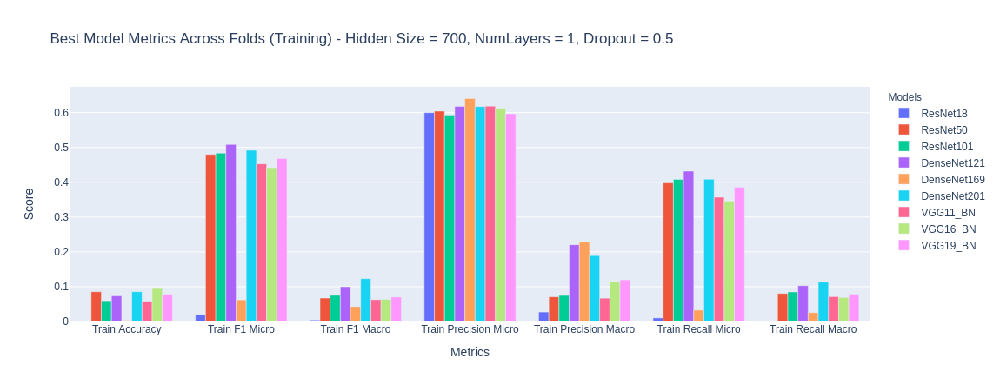

In [33]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 700, NumLayers = 1, Dropout = 0.5',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

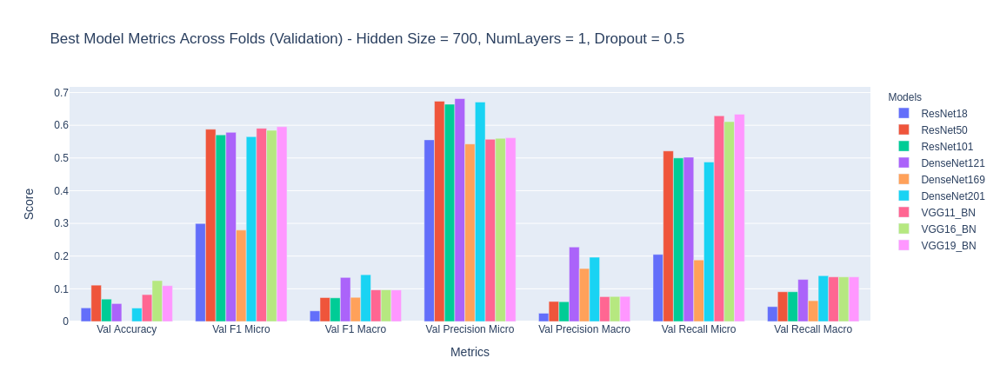

In [34]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 700, NumLayers = 1, Dropout = 0.5',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()